In [1]:
import numpy as np
import pandas as pd

In [2]:
train = pd.read_csv('data/train.csv')
data = pd.read_csv('cleaned_data.csv')
train_len = len(train)

In [3]:
print(data.head())

   Id  1stFlrSF  2ndFlrSF  3SsnPorch    Alley  BedroomAbvGr BldgType BsmtCond  \
0   1       856       854          0  NoAlley             3     1Fam       TA   
1   2      1262         0          0  NoAlley             3     1Fam       TA   
2   3       920       866          0  NoAlley             3     1Fam       TA   
3   4       961       756          0  NoAlley             3     1Fam       Gd   
4   5      1145      1053          0  NoAlley             4     1Fam       TA   

  BsmtExposure  BsmtFinSF1  ...  SaleType ScreenPorch Street  TotRmsAbvGrd  \
0           No       706.0  ...        WD           0   Pave             8   
1           Gd       978.0  ...        WD           0   Pave             6   
2           Mn       486.0  ...        WD           0   Pave             6   
3           No       216.0  ...        WD           0   Pave             7   
4           Av       655.0  ...        WD           0   Pave             9   

   TotalBsmtSF Utilities  WoodDeckSF YearBui

In [4]:
data.set_index(['Id'], inplace = True)
data = data.loc[0:train_len].copy()

We want to see which variables are the best ones to use in our regression. We will begin by looking at correlation between the price and each variable.

In [5]:
var_class = pd.read_csv('var_cat.csv')

The very first, and usually the most important, variable for a house's price is square footage. Let's take a look:

In [6]:
sqft_df = data[['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'SalePrice']].copy()

In [7]:
sqft_df['TotalAGSF'] = sqft_df['1stFlrSF'] + sqft_df['2ndFlrSF']

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
sqft_list = ['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF']

X = 1stFlrSF --- Y = SalePrice
X = 2ndFlrSF --- Y = SalePrice
X = BsmtFinSF1 --- Y = SalePrice
X = BsmtFinSF2 --- Y = SalePrice
X = BsmtUnfSF --- Y = SalePrice
X = TotalBsmtSF --- Y = SalePrice


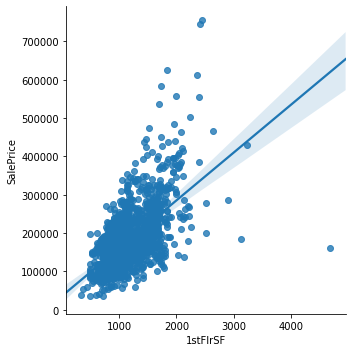

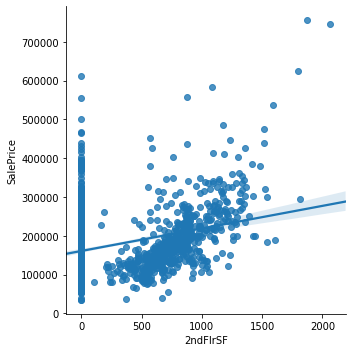

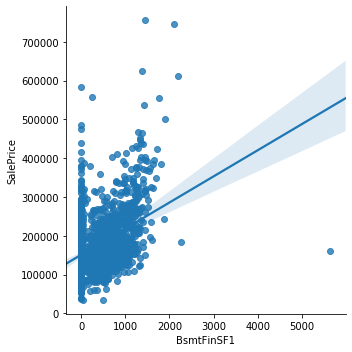

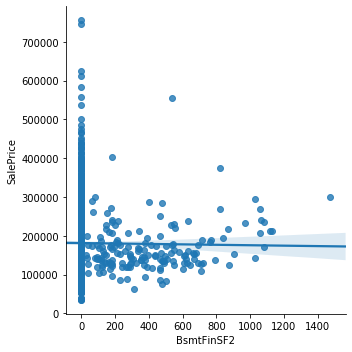

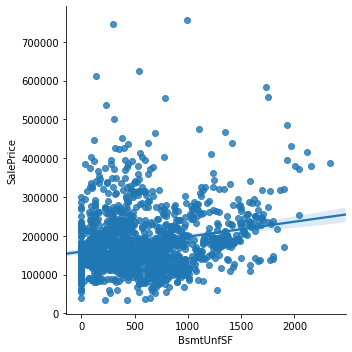

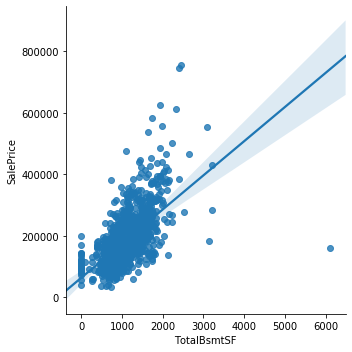

In [10]:
for metric in sqft_list:
    print('X = ' + metric + ' --- Y = SalePrice')
    sns.lmplot(x = metric, y = 'SalePrice', data = sqft_df)

In [11]:
sqft_corr = sqft_df.corr()

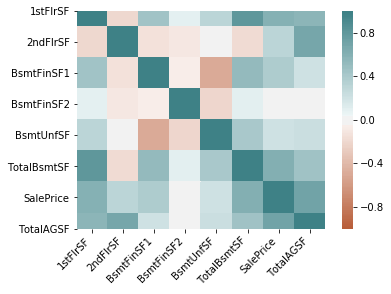

In [12]:
ax = sns.heatmap(sqft_corr, vmin = -1, vmax =1, center = 0, cmap = sns.diverging_palette(25, 200, n = 200), square = True)

ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, horizontalalignment = 'right');

In [13]:
def heatmap(x, y, size, color):
    fig, ax = plt.subplots(figsize = (len(x)*.07, len(x)*.07))
    
    # Mapping from column names to integer coordinates
    x_labels = [v for v in sorted(x.unique())]
    y_labels = [v for v in sorted(y.unique())]
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 
    
    size_scale = 500
    ax.scatter(
        x=x.map(x_to_num), # Use mapping for x
        y=y.map(y_to_num), # Use mapping for y
        s=size * size_scale, # Vector of square sizes, proportional to size parameter
        marker='s' # Use square as scatterplot marker
    )
    
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=45, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    #fix limits
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    
    #add grid
    ax.grid(False, 'major')
    ax.grid(True, 'minor')
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    n_colors = 256 # Use 256 colors for the diverging color palette
    palette = sns.diverging_palette(20, 220, n=n_colors) # Create the palette
    color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
        ind = int(val_position * (n_colors - 1)) # target index in the color palette
        return palette[ind]

    ax.scatter(
        x=x.map(x_to_num),
        y=y.map(y_to_num),
        s=size * size_scale,
        c=color.apply(value_to_color), # Vector of square color values, mapped to color palette
        marker='s'
    )

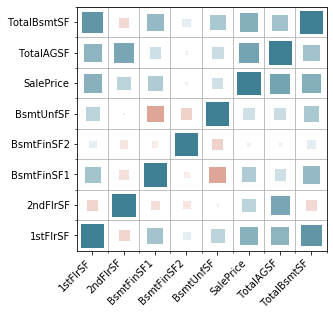

In [14]:
corr = pd.melt(sqft_corr.reset_index(), id_vars = 'index')
corr.columns = ['x', 'y', 'value']
heatmap(
        x = corr['x'],
        y = corr['y'],
        size = corr['value'].abs(),
        color = corr['value']
        )

The above function was taken from Drazen Zaric's article: https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec

In [15]:
print(corr[corr['y'] == 'SalePrice'].to_string())

              x          y     value
48     1stFlrSF  SalePrice  0.605852
49     2ndFlrSF  SalePrice  0.319334
50   BsmtFinSF1  SalePrice  0.386420
51   BsmtFinSF2  SalePrice -0.011378
52    BsmtUnfSF  SalePrice  0.214479
53  TotalBsmtSF  SalePrice  0.613581
54    SalePrice  SalePrice  1.000000
55    TotalAGSF  SalePrice  0.716883


In [16]:
print(corr.to_string())

              x            y     value
0      1stFlrSF     1stFlrSF  1.000000
1      2ndFlrSF     1stFlrSF -0.202646
2    BsmtFinSF1     1stFlrSF  0.445863
3    BsmtFinSF2     1stFlrSF  0.097117
4     BsmtUnfSF     1stFlrSF  0.317987
5   TotalBsmtSF     1stFlrSF  0.819530
6     SalePrice     1stFlrSF  0.605852
7     TotalAGSF     1stFlrSF  0.572041
8      1stFlrSF     2ndFlrSF -0.202646
9      2ndFlrSF     2ndFlrSF  1.000000
10   BsmtFinSF1     2ndFlrSF -0.137079
11   BsmtFinSF2     2ndFlrSF -0.099260
12    BsmtUnfSF     2ndFlrSF  0.004469
13  TotalBsmtSF     2ndFlrSF -0.174512
14    SalePrice     2ndFlrSF  0.319334
15    TotalAGSF     2ndFlrSF  0.687285
16     1stFlrSF   BsmtFinSF1  0.445863
17     2ndFlrSF   BsmtFinSF1 -0.137079
18   BsmtFinSF1   BsmtFinSF1  1.000000
19   BsmtFinSF2   BsmtFinSF1 -0.050117
20    BsmtUnfSF   BsmtFinSF1 -0.495251
21  TotalBsmtSF   BsmtFinSF1  0.522396
22    SalePrice   BsmtFinSF1  0.386420
23    TotalAGSF   BsmtFinSF1  0.215913
24     1stFlrSF   BsmtFin

Now that we have a nice way to visualize and track correlation, let's take a look at the other variables. We'll start with binary variables within our analysis because we need to convert this into a machine-readable format.

In [17]:
binary_list = list(var_class[var_class['Variable_Type'] == 'Binary']['DType'].values)

In [18]:
print(binary_list)

['CentralAir', 'Street']


In [19]:
street_dict = {'Pave': 1, 'Grvl' : 0}
centair_dict = {'Y': 1, 'N' : 0}

In [20]:
data['Street'] = data['Street'].map(street_dict)
data['CentralAir'] = data['CentralAir'].map(centair_dict)

Let's look at the street data separately to see what that looks like. We will do some hypothesis testing for the variables:

In [21]:
street_list = ['Street', 'Alley', 'LotFrontage', 'LotConfig', 'PavedDrive', 'SalePrice']
street_df = data[street_list].copy()

Alley: Nominal

Street: Binary

LotFrontage: Continuous

LotConfig: Nominal

PavedDrive: Ordinal

In [22]:
street_df['Alley'].value_counts()

NoAlley    1369
Grvl         50
Pave         41
Name: Alley, dtype: int64

In [23]:
street_df['LotConfig'].value_counts()

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

In [24]:
street_df['PavedDrive'].value_counts()

Y    1340
N      90
P      30
Name: PavedDrive, dtype: int64

In [25]:
paveddrive_dict = {'Y': 2, 'P': 1, 'N':0}

In [26]:
street_df['PavedDrive'] = street_df['PavedDrive'].map(paveddrive_dict)

In [27]:
street_df['SalePrice'].corr(street_df['PavedDrive'])

0.2313569522572269

In [28]:
street_df_onehot = data[['PavedDrive', 'SalePrice']].copy()
street_df_onehot = pd.get_dummies(street_df_onehot, columns = ['PavedDrive'], prefix = ['PavD'])

In [29]:
street_df_onehot.corr()

,SalePrice,PavD_N,PavD_P,PavD_Y
SalePrice,1.000000,-0.212630,-0.088623,0.231968
PavD_N,-0.212630,1.000000,-0.037124,-0.856491
PavD_P,-0.088623,-0.037124,1.000000,-0.484010
PavD_Y,0.231968,-0.856491,-0.484010,1.000000


In [30]:
pavD_dict = {}
PavD_list = ['Y', 'P', 'N']
for pave_type in PavD_list:
    pavD_dict[pave_type] = data[data['PavedDrive'] == pave_type]['SalePrice']

Y_std : 79665.50304698841
P_std : 33503.03022836529
N_std : 44352.5233090945


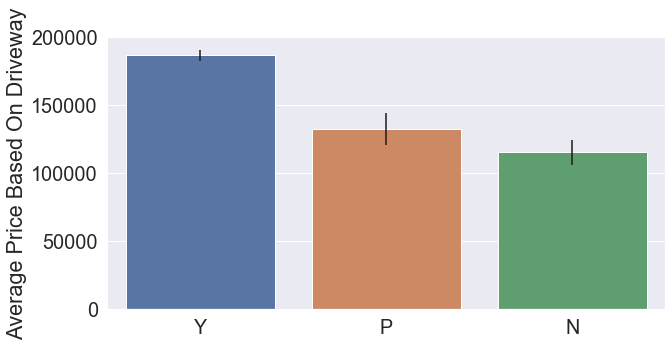

In [31]:
price_list = []
p_error = []
for pave_type in PavD_list:
    price_list.append(pavD_dict[pave_type].mean())
    p_error.append(1.96*pavD_dict[pave_type].std()/np.sqrt(pavD_dict[pave_type].shape[0]))
    print(pave_type + '_std : {}'.format(pavD_dict[pave_type].std()))
sns.set(font_scale=1.8)
fig = plt.figure(figsize=(10,5))
ax = sns.barplot(PavD_list, price_list, yerr=p_error)
ax.set_ylabel('Average Price Based On Driveway')
plt.show()

In [32]:
from scipy import stats

In [33]:
stats.f_oneway(pavD_dict['Y'], pavD_dict['P'], pavD_dict['N']
)

F_onewayResult(statistic=42.02417941762533, pvalue=1.803568890651533e-18)

Calculating the effect size

In [34]:
ss_b = 0
for t in PavD_list:
    ss_b += pavD_dict[t].shape[0] * np.sum((pavD_dict[t].mean() - data['SalePrice'].mean())**2)

In [35]:
ss_w = 0
for t in PavD_list:
    ss_w += np.sum((pavD_dict[t] - pavD_dict[t].mean())**2)
msb = ss_b/4
msw = ss_w/len(data)-5
f = msb/msw
print('F_stat: {}'.format(f))

F_stat: 21.055354152773248


In [36]:
ss_t = np.sum((data['SalePrice']-data['SalePrice'].mean())**2)        
eta_squared = ss_b/ss_t
print('eta_squared: {}'.format(eta_squared))

eta_squared: 0.05453972833063836


In [37]:
def get_Fstats(parameter):
    results = {}
    results['Parameter'] = parameter
    par_list = list(set(data[parameter].values.tolist())) #remove duplicates
    par_dict = {}
    for par in par_list:
        par_dict[par] = data[data[parameter] == par]['SalePrice']
    price_list = []
    p_error = []
    for par in par_list:
        price_list.append(par_dict[par].mean())
        p_error.append(1.96*par_dict[par].std()/np.sqrt(par_dict[par].shape[0]))
        print(parameter + ': ' + str(par) + '_std : {}'.format(par_dict[par].std()))
    sns.set(font_scale=1.8)
    fig = plt.figure(figsize=(10,5))
    ax = sns.barplot(par_list, price_list, yerr=p_error)
    ax.set_ylabel('Average Price Based On ' + parameter)
    plt.show()
    f_value, p_value = stats.f_oneway(*[par_dict[par] for par in par_list])
    print('F Value: ' + str(f_value) + ' --- p Value: ' + str(p_value))
    results['f_value'] = f_value
    results['p_value'] = p_value
    #calculates the size of the effect on the price variable, eta-squared
    ss_b = 0
    for t in par_list:
        ss_b += par_dict[t].shape[0] * np.sum((par_dict[t].mean() - data['SalePrice'].mean())**2)
    ss_w = 0
    for t in par_list:
        ss_w += np.sum((par_dict[t] - par_dict[t].mean())**2)
    msb = ss_b/4
    msw = ss_w/len(data)-5
    f = msb/msw
    print(parameter + ' --- F_stat: {}'.format(f))
    results['F_stat'] = f
    
    ss_t = np.sum((data['SalePrice']-data['SalePrice'].mean())**2)        
    eta_squared = ss_b/ss_t
    print(parameter + ' --- eta_squared: {}'.format(eta_squared))
    results['eta_squared'] = eta_squared
    return results

PavedDrive: N_std : 44352.5233090945
PavedDrive: P_std : 33503.03022836529
PavedDrive: Y_std : 79665.50304698841


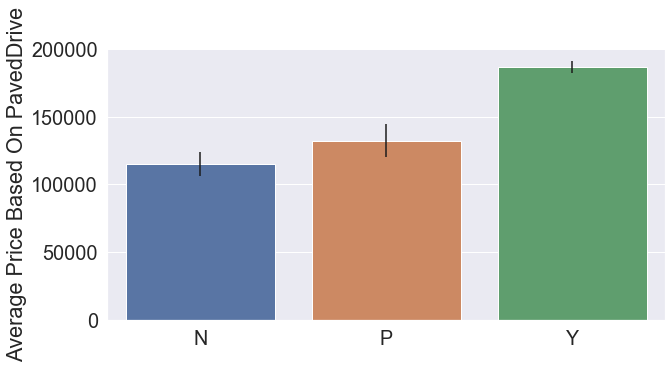

F Value: 42.02417941762533 --- p Value: 1.803568890651533e-18
PavedDrive --- F_stat: 21.05535415277325
PavedDrive --- eta_squared: 0.054539728330638367


{'Parameter': 'PavedDrive',
 'f_value': 42.02417941762533,
 'p_value': 1.803568890651533e-18,
 'F_stat': 21.05535415277325,
 'eta_squared': 0.054539728330638367}

In [38]:
get_Fstats('PavedDrive')

Let's look at the ordinal variable types and apply our anova test

In [39]:
ordinal_list = list(var_class[var_class['Variable_Type'] == 'Ordinal']['DType'].values)

In [40]:
print(ordinal_list)

['BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'Electrical', 'ExterCond', 'ExterQual', 'FireplaceQu', 'Functional', 'GarageCars', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageYrBlt', 'HeatingQC', 'HouseStyle', 'KitchenQual', 'LandContour', 'LandSlope', 'OverallCond', 'OverallQual', 'PavedDrive', 'SaleCondition', 'Utilities']


We will store the results in a dataframe for easy reading:

In [41]:
anova_results = pd.DataFrame(columns = ['Parameter', 'f_value', 'p_value', 'F_stat', 'eta_squared'])

BsmtCond: Po_std : 4242.640687119285
BsmtCond: Fa_std : 43467.796975357625
BsmtCond: TA_std : 79515.38844895519
BsmtCond: Gd_std : 72663.15502580277
BsmtCond: NoBs_std : 29278.694796523767


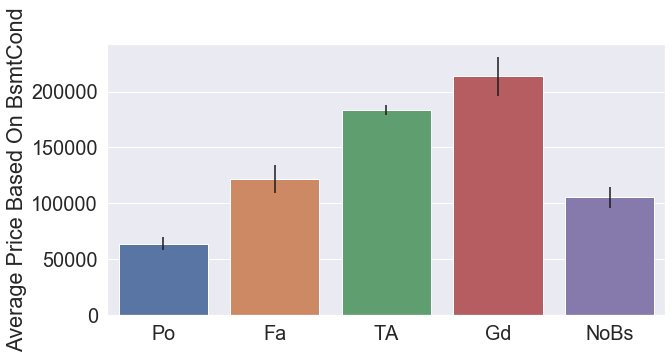

F Value: 19.70813904568719 --- p Value: 8.195793756122466e-16
BsmtCond --- F_stat: 19.775864625945772
BsmtCond --- eta_squared: 0.051395803189195226
BsmtExposure: Mn_std : 77335.44265241364
BsmtExposure: Gd_std : 118923.67258342211
BsmtExposure: Av_std : 88655.50484861624
BsmtExposure: NoBs_std : 32133.440663579764
BsmtExposure: No_std : 60695.72491495807


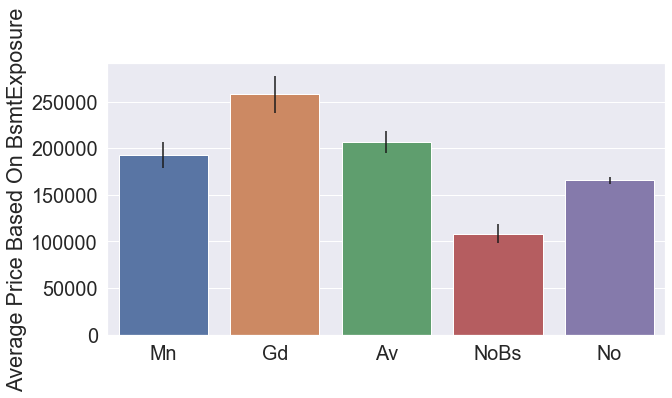

F Value: 63.939761270066484 --- p Value: 7.557758359196251e-50
BsmtExposure --- F_stat: 64.15948559540588
BsmtExposure --- eta_squared: 0.1495003319232874
BsmtFinType1: ALQ_std : 50821.27723133841
BsmtFinType1: LwQ_std : 50796.98708294542
BsmtFinType1: BLQ_std : 47327.29212646023
BsmtFinType1: Unf_std : 72577.08012914399
BsmtFinType1: Rec_std : 45190.11887928968
BsmtFinType1: GLQ_std : 93215.61325789883
BsmtFinType1: NoBs_std : 29278.694796523767


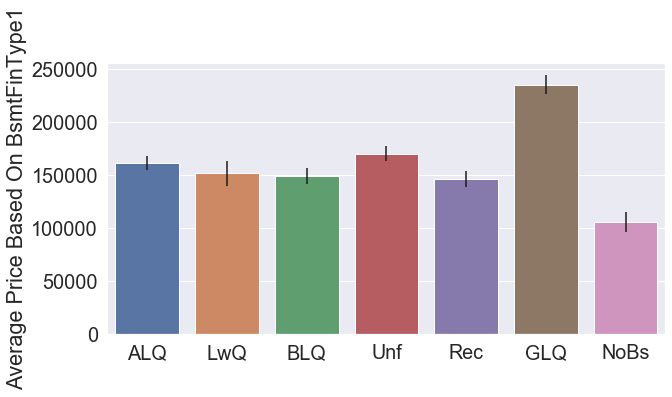

F Value: 64.68820019667085 --- p Value: 2.3863579356147888e-71
BsmtFinType1 --- F_stat: 97.4997650192868
BsmtFinType1 --- eta_squared: 0.21081040968296155
BsmtFinType2: ALQ_std : 104764.74341107461
BsmtFinType2: LwQ_std : 43255.03524066877
BsmtFinType2: BLQ_std : 41611.30538837973
BsmtFinType2: Unf_std : 81275.31390854601
BsmtFinType2: Rec_std : 59183.27702036844
BsmtFinType2: GLQ_std : 64573.04035902903
BsmtFinType2: NoBs_std : 40879.30731247528


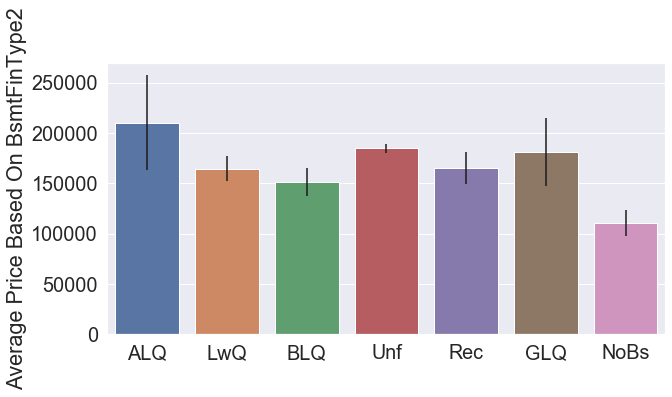

F Value: 7.565378462472953 --- p Value: 5.22564949005886e-08
BsmtFinType2 --- F_stat: 11.402738366387691
BsmtFinType2 --- eta_squared: 0.030293983531672126
BsmtQual: Fa_std : 34469.66727811374
BsmtQual: TA_std : 43483.26531066869
BsmtQual: Ex_std : 113563.23739238834
BsmtQual: Gd_std : 58092.36428357409
BsmtQual: NoBs_std : 29278.694796523767


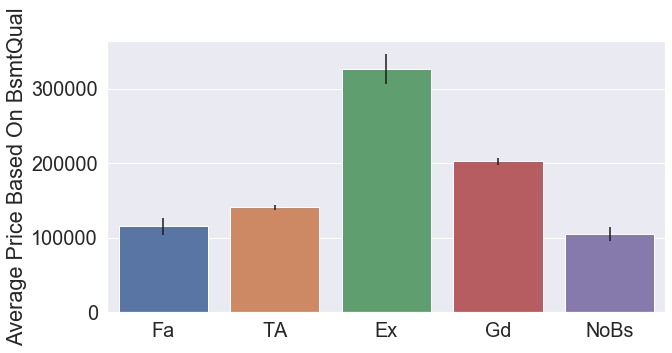

F Value: 316.1486350004241 --- p Value: 8.158548084712274e-196
BsmtQual --- F_stat: 317.23505689663585
BsmtQual --- eta_squared: 0.464993778080209
Electrical: FuseP_std : 34645.827069552455
Electrical: Mix_std : nan
Electrical: SBrkr_std : 79828.27369664964
Electrical: FuseA_std : 37511.37661536775
Electrical: FuseF_std : 30636.507375670084


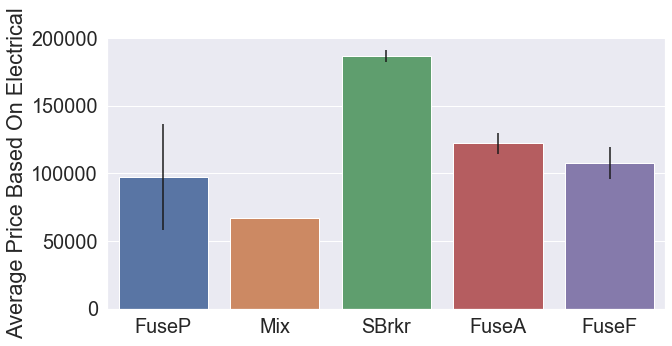

F Value: 23.074438198968412 --- p Value: 1.6412076757769925e-18
Electrical --- F_stat: 23.153731820547353
Electrical --- eta_squared: 0.059650931844951766
ExterCond: Po_std : nan
ExterCond: Fa_std : 40094.38394007809
ExterCond: TA_std : 79806.25723270058
ExterCond: Ex_std : 109235.22020545084
ExterCond: Gd_std : 72608.30363180496


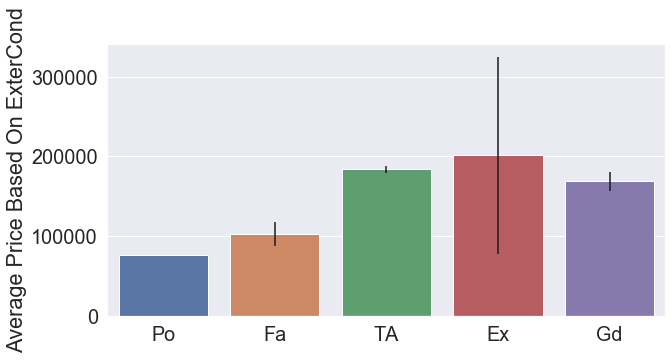

F Value: 8.798714214177487 --- p Value: 5.106680608671862e-07
ExterCond --- F_stat: 8.828950352666554
ExterCond --- eta_squared: 0.023617620672068997
ExterQual: Fa_std : 39826.918794238365
ExterQual: TA_std : 42471.815703322456
ExterQual: Ex_std : 116401.2642002236
ExterQual: Gd_std : 71188.87389907481


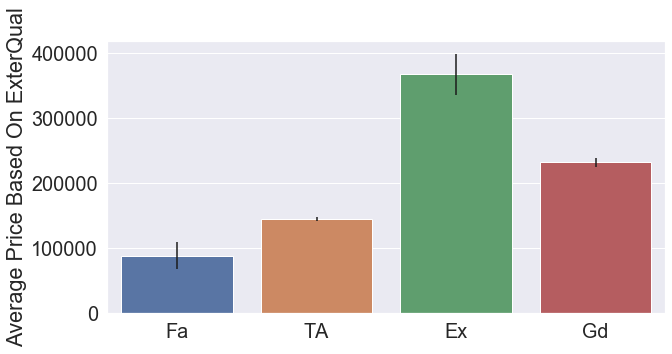

F Value: 443.33483141504627 --- p Value: 1.4395510967787893e-204
ExterQual --- F_stat: 333.41458869223936
ExterQual --- eta_squared: 0.4773877777270065
FireplaceQu: Fa_std : 34287.71756413039
FireplaceQu: Po_std : 31080.842114641342
FireplaceQu: TA_std : 71367.02877236484
FireplaceQu: NoFp_std : 44389.78688372388
FireplaceQu: Ex_std : 123611.4717643113
FireplaceQu: Gd_std : 91123.14836915988


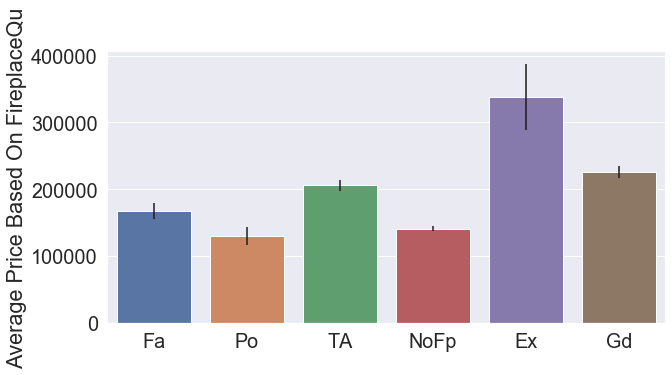

F Value: 121.07512126691806 --- p Value: 2.9712169727633336e-107
FireplaceQu --- F_stat: 151.9684295462442
FireplaceQu --- eta_squared: 0.29396075415891554
Functional: Mod_std : 118938.66646701728
Functional: Min2_std : 41215.354651922855
Functional: Maj1_std : 64503.775815370376
Functional: Sev_std : nan
Functional: Typ_std : 80017.9596583151
Functional: Maj2_std : 27086.897201414562
Functional: Min1_std : 38089.57248720527


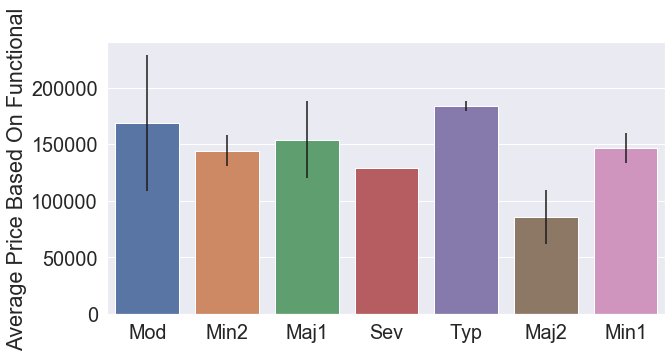

F Value: 4.0578754277920215 --- p Value: 0.0004841696801078294
Functional --- F_stat: 6.116137091554001
Functional --- eta_squared: 0.016480385721401015
GarageCars: 0.0_std : 32815.02338915613
GarageCars: 1.0_std : 30412.386890154037
GarageCars: 2.0_std : 51617.14425804544
GarageCars: 3.0_std : 106832.92593867525
GarageCars: 4.0_std : 52621.839745489706


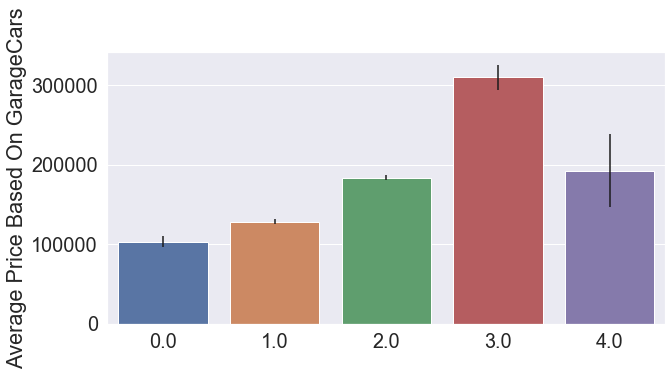

F Value: 351.2074862087727 --- p Value: 1.1211287650614395e-211
GarageCars --- F_stat: 352.4143853359622
GarageCars --- eta_squared: 0.4912284897821431
GarageCond: Po_std : 22662.377045079214
GarageCond: Fa_std : 36420.90358772306
GarageCond: NoGar_std : 32815.02338915613
GarageCond: TA_std : 79103.3226401172
GarageCond: Ex_std : 4949.747468305833
GarageCond: Gd_std : 64769.31835367731


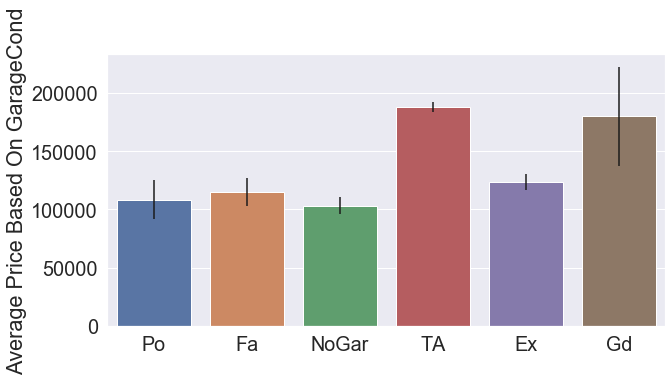

F Value: 25.750152898462716 --- p Value: 5.711745645774751e-25
GarageCond --- F_stat: 32.32051518586674
GarageCond --- eta_squared: 0.0813462026875798
GarageFinish: NoGar_std : 32815.02338915613
GarageFinish: Fin_std : 96960.59323173358
GarageFinish: Unf_std : 46498.52821066212
GarageFinish: RFn_std : 63536.22251751612


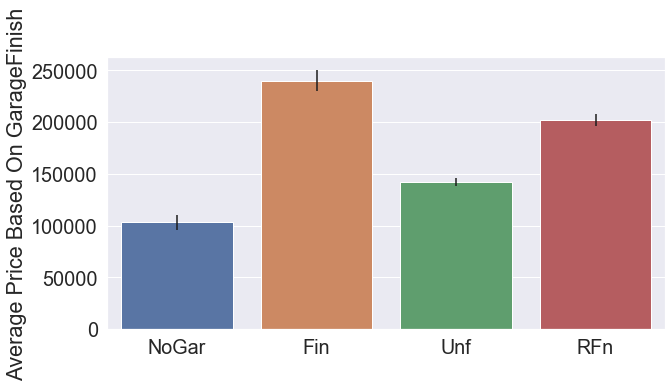

F Value: 213.86702758266088 --- p Value: 6.228747181514921e-115
GarageFinish --- F_stat: 160.84093095500506
GarageFinish --- eta_squared: 0.30587373739693474
GarageQual: Fa_std : 42971.44098489956
GarageQual: Po_std : 35143.7524082636
GarageQual: NoGar_std : 32815.02338915613
GarageQual: TA_std : 78774.94856727551
GarageQual: Ex_std : 202680.1667652758
GarageQual: Gd_std : 74126.73902116623


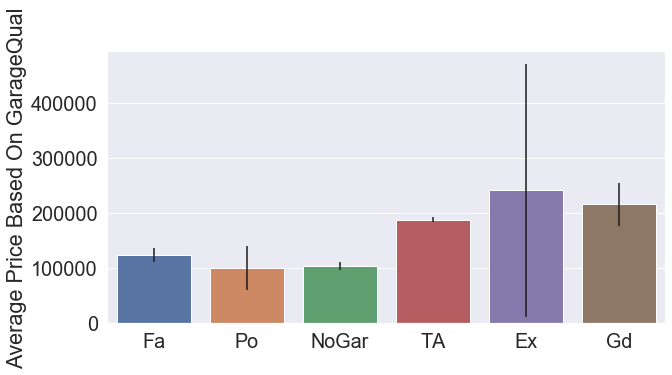

F Value: 25.776093275332265 --- p Value: 5.388762379335977e-25
GarageQual --- F_stat: 32.35307446222927
GarageQual --- eta_squared: 0.0814214775621554
GarageYrBlt: 1908.0_std : nan
GarageYrBlt: 1933.0_std : nan
GarageYrBlt: 2004.0_std : 63830.358969184716
GarageYrBlt: 1954.0_std : 43764.27352792345
GarageYrBlt: 1996.0_std : 141963.42864402937
GarageYrBlt: 1922.0_std : 43875.67663295918
GarageYrBlt: 1990.0_std : 66984.15265008583
GarageYrBlt: 1947.0_std : 11667.261889578034
GarageYrBlt: 1983.0_std : 74572.70980472043
GarageYrBlt: 1900.0_std : nan
GarageYrBlt: 1985.0_std : 52066.30388264563
GarageYrBlt: 1982.0_std : 128637.09612705038
GarageYrBlt: 1970.0_std : 51377.191335004725
GarageYrBlt: 1977.0_std : 39973.13525377771
GarageYrBlt: 1923.0_std : 49538.705406311674
GarageYrBlt: 1998.0_std : 57743.31544425401
GarageYrBlt: 2002.0_std : 48460.06333530259
GarageYrBlt: 1979.0_std : 42485.744319824786
GarageYrBlt: 1959.0_std : 59229.51184611782
GarageYrBlt: 1964.0_std : 25919.477450756243
Gar

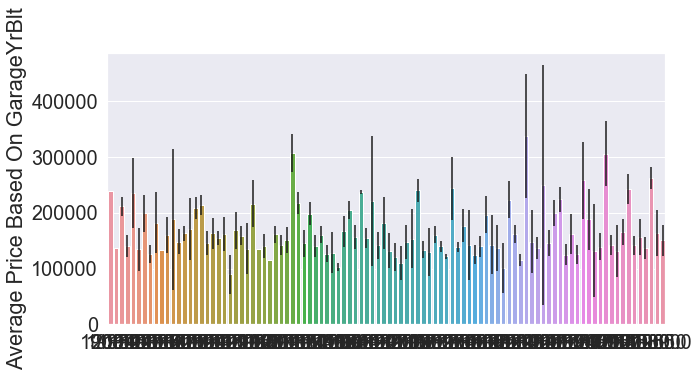

F Value: 9.098053799944166 --- p Value: 1.2404845895495012e-92
GarageYrBlt --- F_stat: 236.50263965335193
GarageYrBlt --- eta_squared: 0.3931863700584104
HeatingQC: Po_std : nan
HeatingQC: Fa_std : 50306.61899629547
HeatingQC: TA_std : 47226.485662536965
HeatingQC: Ex_std : 87469.70450326536
HeatingQC: Gd_std : 52923.920003191546


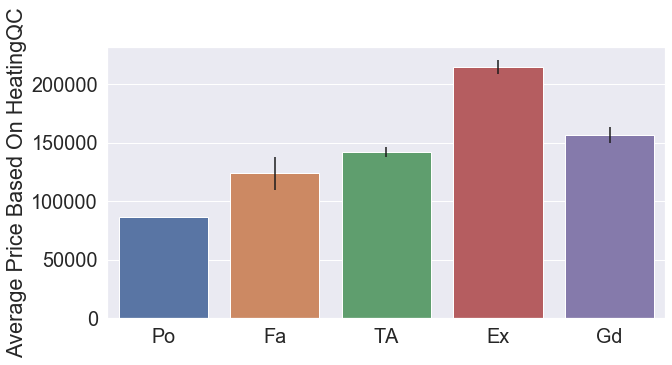

F Value: 88.394461988698 --- p Value: 2.6670620921040538e-67
HeatingQC --- F_stat: 88.69822311386774
HeatingQC --- eta_squared: 0.1955004858400931
HouseStyle: 2Story_std : 87339.21357029205
HouseStyle: 2.5Unf_std : 63934.1280324736
HouseStyle: 2.5Fin_std : 118211.97667144996
HouseStyle: SFoyer_std : 30480.898191983946
HouseStyle: SLvl_std : 38305.16133943812
HouseStyle: 1.5Unf_std : 19036.47308963264
HouseStyle: 1Story_std : 77055.7150112436
HouseStyle: 1.5Fin_std : 54277.94111909711


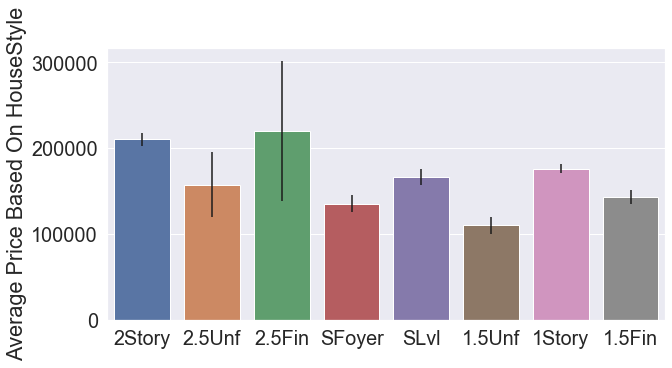

F Value: 19.595000995981213 --- p Value: 3.376776535121222e-25
HouseStyle --- F_stat: 34.480184289375366
HouseStyle --- eta_squared: 0.08631262730434419
KitchenQual: Fa_std : 36004.254036798055
KitchenQual: TA_std : 38896.28033636347
KitchenQual: Ex_std : 120862.94257329601
KitchenQual: Gd_std : 64020.17670211764


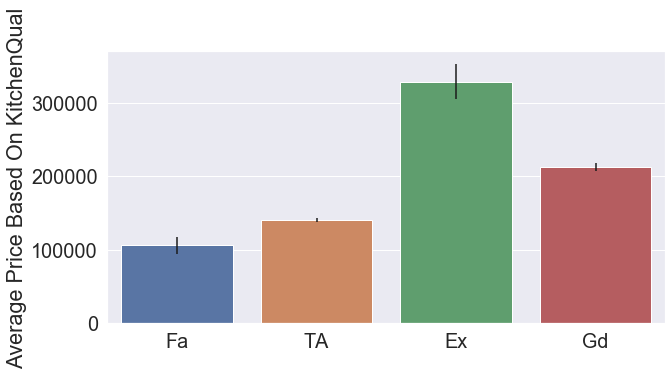

F Value: 407.80635155838837 --- p Value: 3.0322127528407505e-192
KitchenQual --- F_stat: 306.69502445599426
KitchenQual --- eta_squared: 0.45659862444453825
LandContour: Bnk_std : 49361.24407425441
LandContour: Low_std : 83935.3536199234
LandContour: HLS_std : 101790.13974127034
LandContour: Lvl_std : 78463.56791805025


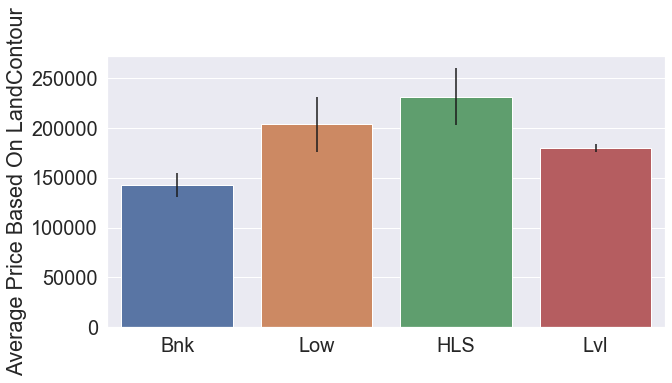

F Value: 12.850188333283924 --- p Value: 2.7422167521379096e-08
LandContour --- F_stat: 9.664118294228476
LandContour --- eta_squared: 0.02579408546130762
LandSlope: Gtl_std : 78669.36915129625
LandSlope: Mod_std : 92375.35811599679
LandSlope: Sev_std : 86729.92240873758


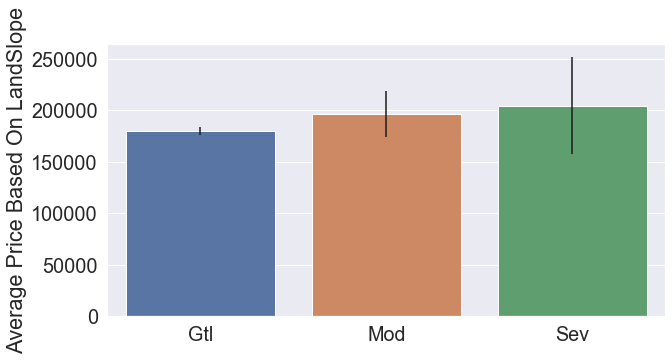

F Value: 1.9588170374149438 --- p Value: 0.1413963584114019
LandSlope --- F_stat: 0.9814251464993874
LandSlope --- eta_squared: 0.0026816255642713575
OverallCond: 1_std : nan
OverallCond: 2_std : 141342.81348834117
OverallCond: 3_std : 44852.49040280075
OverallCond: 4_std : 38922.52590679222
OverallCond: 5_std : 85117.31941604606
OverallCond: 6_std : 60737.96982404184
OverallCond: 7_std : 53468.1894307819
OverallCond: 8_std : 52375.14468136743
OverallCond: 9_std : 96485.97468901018


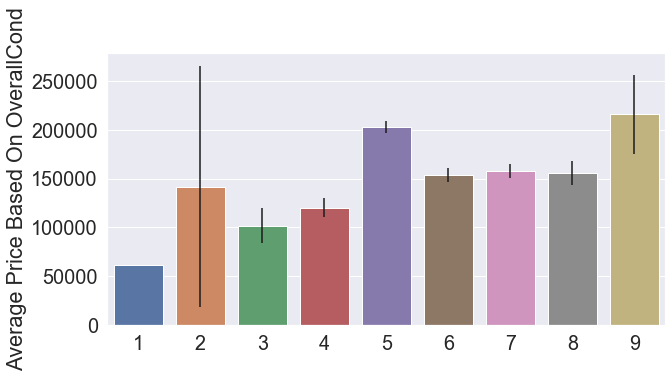

F Value: 26.00317308892095 --- p Value: 7.962288819950615e-38
OverallCond --- F_stat: 52.328921770141804
OverallCond --- eta_squared: 0.1253901155632764
OverallQual: 1_std : 15344.217151748082
OverallQual: 2_std : 14254.200796022671
OverallQual: 3_std : 24688.567398643616
OverallQual: 4_std : 29022.003885538878
OverallQual: 5_std : 27107.330927354826
OverallQual: 6_std : 36090.182932676726
OverallQual: 7_std : 44466.25941417711
OverallQual: 8_std : 63898.90225298427
OverallQual: 9_std : 81278.17484929628
OverallQual: 10_std : 159785.49105786977


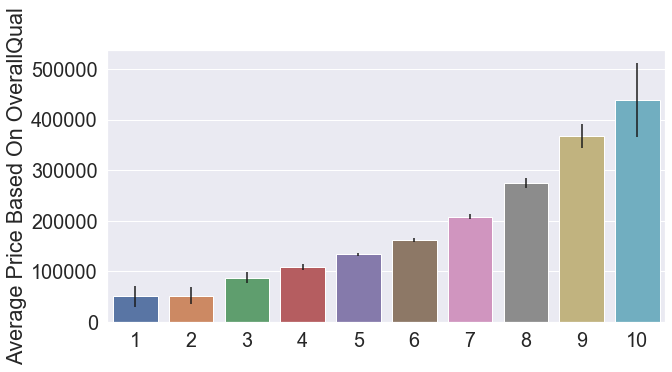

F Value: 349.02683956930736 --- p Value: 0.0
OverallQual --- F_stat: 790.726324733349
OverallQual --- eta_squared: 0.6841812868534438
PavedDrive: N_std : 44352.5233090945
PavedDrive: P_std : 33503.03022836529
PavedDrive: Y_std : 79665.50304698841


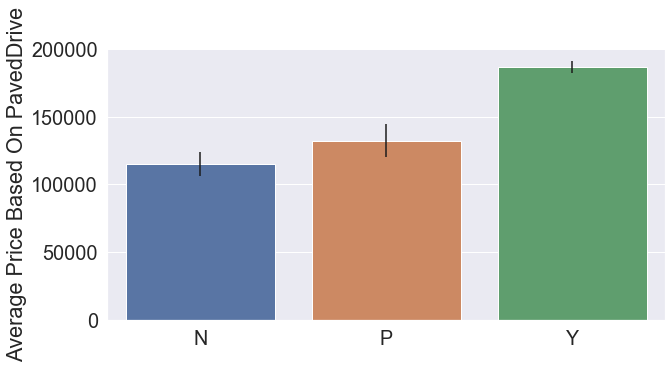

F Value: 42.02417941762533 --- p Value: 1.803568890651533e-18
PavedDrive --- F_stat: 21.05535415277325
PavedDrive --- eta_squared: 0.054539728330638367
SaleCondition: Partial_std : 103696.40411896702
SaleCondition: Abnorml_std : 82796.2133954025
SaleCondition: Family_std : 47820.00242136075
SaleCondition: AdjLand_std : 26135.464411408495
SaleCondition: Alloca_std : 84460.52750191368
SaleCondition: Normal_std : 69713.63628009132


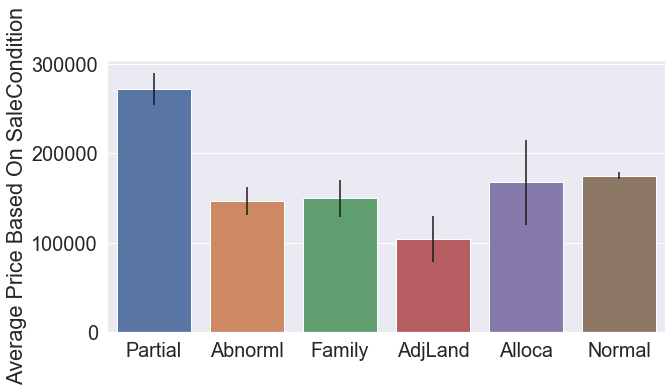

F Value: 45.5784283096957 --- p Value: 7.988268404991176e-44
SaleCondition --- F_stat: 57.20813737377988
SaleCondition --- eta_squared: 0.1354974768707009
Utilities: NoSeWa_std : nan
Utilities: AllPub_std : 79461.59981439645


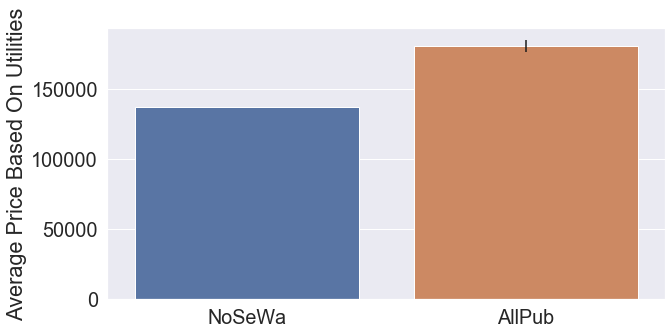

F Value: 0.29880407484898486 --- p Value: 0.5847167739689381
Utilities --- F_stat: 0.07480348930477525
Utilities --- eta_squared: 0.00020489907419114106


In [42]:
for par in ordinal_list:
    temp_result = get_Fstats(par)
    anova_results = anova_results.append(temp_result, ignore_index = True)

In [43]:
print(anova_results.to_string())

        Parameter     f_value        p_value      F_stat  eta_squared
0        BsmtCond   19.708139   8.195794e-16   19.775865     0.051396
1    BsmtExposure   63.939761   7.557758e-50   64.159486     0.149500
2    BsmtFinType1   64.688200   2.386358e-71   97.499765     0.210810
3    BsmtFinType2    7.565378   5.225649e-08   11.402738     0.030294
4        BsmtQual  316.148635  8.158548e-196  317.235057     0.464994
5      Electrical   23.074438   1.641208e-18   23.153732     0.059651
6       ExterCond    8.798714   5.106681e-07    8.828950     0.023618
7       ExterQual  443.334831  1.439551e-204  333.414589     0.477388
8     FireplaceQu  121.075121  2.971217e-107  151.968430     0.293961
9      Functional    4.057875   4.841697e-04    6.116137     0.016480
10     GarageCars  351.207486  1.121129e-211  352.414385     0.491228
11     GarageCond   25.750153   5.711746e-25   32.320515     0.081346
12   GarageFinish  213.867028  6.228747e-115  160.840931     0.305874
13     GarageQual   

Common industry practice uses a 95% confidence level. If the p-value is less than 0.05, we can assume that the null hypothesis, that the means based on the variable are the same, can be rejected. If it is greater, we will fail to reject the null hypothesis.

In [44]:
reject_anova = anova_results[anova_results['p_value'] < 0.05].copy()
null_anova = anova_results[anova_results['p_value'] > 0.05].copy()

In [45]:
print(reject_anova.to_string())
print(null_anova.to_string())

        Parameter     f_value        p_value      F_stat  eta_squared
0        BsmtCond   19.708139   8.195794e-16   19.775865     0.051396
1    BsmtExposure   63.939761   7.557758e-50   64.159486     0.149500
2    BsmtFinType1   64.688200   2.386358e-71   97.499765     0.210810
3    BsmtFinType2    7.565378   5.225649e-08   11.402738     0.030294
4        BsmtQual  316.148635  8.158548e-196  317.235057     0.464994
5      Electrical   23.074438   1.641208e-18   23.153732     0.059651
6       ExterCond    8.798714   5.106681e-07    8.828950     0.023618
7       ExterQual  443.334831  1.439551e-204  333.414589     0.477388
8     FireplaceQu  121.075121  2.971217e-107  151.968430     0.293961
9      Functional    4.057875   4.841697e-04    6.116137     0.016480
10     GarageCars  351.207486  1.121129e-211  352.414385     0.491228
11     GarageCond   25.750153   5.711746e-25   32.320515     0.081346
12   GarageFinish  213.867028  6.228747e-115  160.840931     0.305874
13     GarageQual   

It turns out that LandSlope and Utilities surprisingly don't have a significant effect on the price. We will not get rid of the data until we do further testing. 

For eta-squared, general rules of thumb of analyzing eta-squared come from this study: http://imaging.mrc-cbu.cam.ac.uk/statswiki/FAQ/effectSize.

In [46]:
high_effect = reject_anova[reject_anova['eta_squared'] > 0.14]
med_effect = reject_anova[(reject_anova['eta_squared'] > 0.06) & (reject_anova['eta_squared'] < 0.14)]
low_effect = reject_anova[(reject_anova['eta_squared'] > 0.01) & (reject_anova['eta_squared'] < 0.06)]

In [47]:
print(high_effect.to_string())
print(med_effect.to_string())
print(low_effect.to_string())

       Parameter     f_value        p_value      F_stat  eta_squared
1   BsmtExposure   63.939761   7.557758e-50   64.159486     0.149500
2   BsmtFinType1   64.688200   2.386358e-71   97.499765     0.210810
4       BsmtQual  316.148635  8.158548e-196  317.235057     0.464994
7      ExterQual  443.334831  1.439551e-204  333.414589     0.477388
8    FireplaceQu  121.075121  2.971217e-107  151.968430     0.293961
10    GarageCars  351.207486  1.121129e-211  352.414385     0.491228
12  GarageFinish  213.867028  6.228747e-115  160.840931     0.305874
14   GarageYrBlt    9.098054   1.240485e-92  236.502640     0.393186
15     HeatingQC   88.394462   2.667062e-67   88.698223     0.195500
17   KitchenQual  407.806352  3.032213e-192  306.695024     0.456599
21   OverallQual  349.026840   0.000000e+00  790.726325     0.684181
        Parameter    f_value       p_value     F_stat  eta_squared
11     GarageCond  25.750153  5.711746e-25  32.320515     0.081346
13     GarageQual  25.776093  5.388762

We now have what categorical variables have a statistically significant effect on the SalePrice y-variable.

Let's start looking at the nominal data types.

In [48]:
nominal_list = list(var_class[var_class['Variable_Type'] == 'Nominal']['DType'].values)

Alley: Grvl_std : 34780.78073365302
Alley: NoAlley_std : 80667.14517962105
Alley: Pave_std : 38370.3752431323


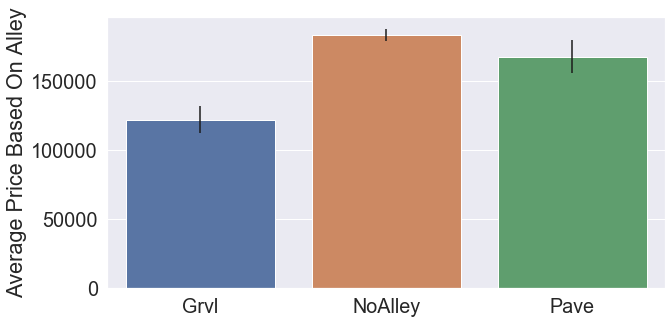

F Value: 15.17661388998799 --- p Value: 2.9963796805460783e-07
Alley --- F_stat: 7.603931467850067
Alley --- eta_squared: 0.020407544901274874
BldgType: Twnhs_std : 41013.222079983665
BldgType: Duplex_std : 27833.249196899593
BldgType: TwnhsE_std : 60626.10891836159
BldgType: 2fmCon_std : 35458.54515813054
BldgType: 1Fam_std : 82648.50292180448


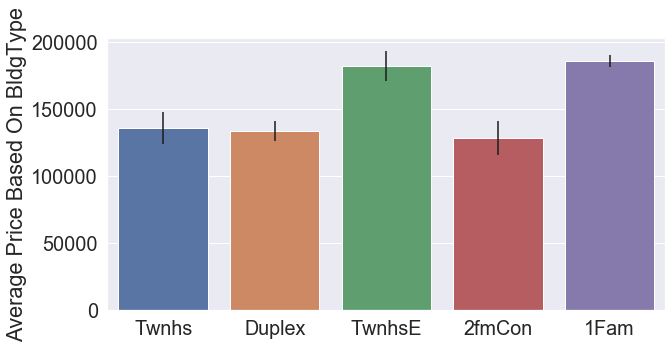

F Value: 13.011077169620853 --- p Value: 2.0567364604967015e-10
BldgType --- F_stat: 13.055788785735551
BldgType --- eta_squared: 0.034534026888778525
Condition1: RRAe_std : 24030.813552603664
Condition1: Feedr_std : 42157.290116630815
Condition1: RRAn_std : 66177.92206957056
Condition1: RRNn_std : 93823.23805966196
Condition1: Norm_std : 81256.98012471797
Condition1: RRNe_std : 5303.300858899106
Condition1: Artery_std : 66226.66054827081
Condition1: PosA_std : 52348.932312757956
Condition1: PosN_std : 65256.53660879834


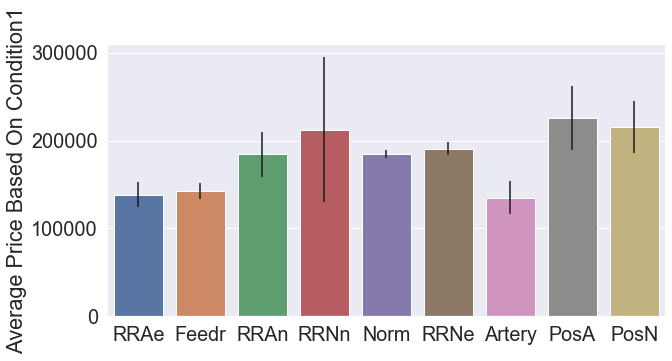

F Value: 6.118017137125925 --- p Value: 8.904549416138853e-08
Condition1 --- F_stat: 12.311929741590937
Condition1 --- eta_squared: 0.032630639959521375
Condition2: RRAe_std : nan
Condition2: Feedr_std : 33544.99465891546
Condition2: RRAn_std : nan
Condition2: RRNn_std : 39951.533137039936
Condition2: Norm_std : 79337.73554722009
Condition2: Artery_std : 16263.455967290593
Condition2: PosA_std : nan
Condition2: PosN_std : 141598.13293260615


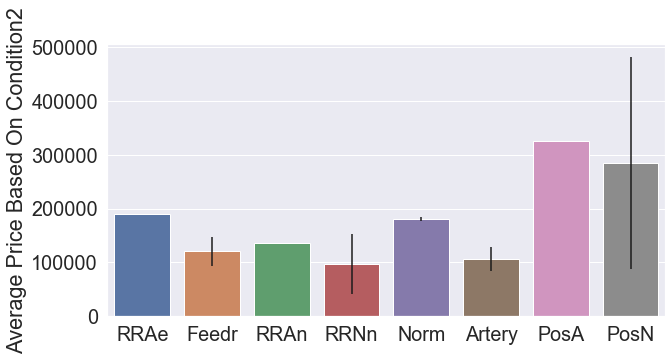

F Value: 2.0738986215227877 --- p Value: 0.043425658360948464
Condition2 --- F_stat: 3.649318858287605
Condition2 --- eta_squared: 0.009899160716467433
Exterior1st: AsbShng_std : 33756.48066040528
Exterior1st: Wd Sdng_std : 71130.44815229959
Exterior1st: ImStucc_std : nan
Exterior1st: CemntBd_std : 120575.62131830868
Exterior1st: BrkComm_std : 15556.349186104046
Exterior1st: BrkFace_std : 82841.91437026676
Exterior1st: Stone_std : 40305.08652763321
Exterior1st: WdShing_std : 72507.53074097782
Exterior1st: Stucco_std : 83307.24652903852
Exterior1st: VinylSd_std : 80646.9757850124
Exterior1st: Plywood_std : 49497.38329262622
Exterior1st: MetalSd_std : 54776.40898954903
Exterior1st: AsphShn_std : nan
Exterior1st: CBlock_std : nan
Exterior1st: HdBoard_std : 66305.71416422456


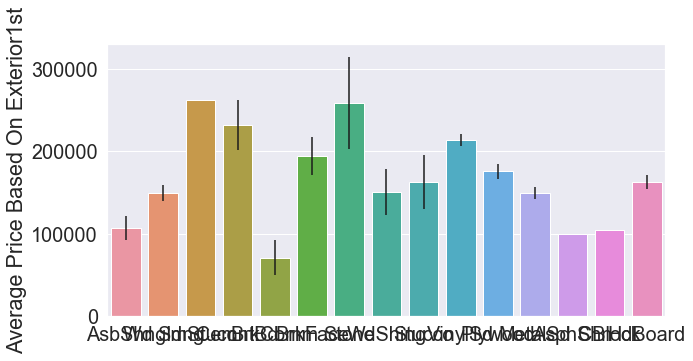

F Value: 18.611742866245784 --- p Value: 2.5860887286376316e-43
Exterior1st --- F_stat: 65.81730528409125
Exterior1st --- eta_squared: 0.15277312314209382
Exterior2nd: AsbShng_std : 42315.043607725194
Exterior2nd: Wd Sdng_std : 59892.85664000947
Exterior2nd: ImStucc_std : 193176.67244721288
Exterior2nd: Wd Shng_std : 88974.21782010706
Exterior2nd: CmentBd_std : 116140.39622059515
Exterior2nd: BrkFace_std : 95097.55175607835
Exterior2nd: Stone_std : 63533.06757272153
Exterior2nd: Other_std : nan
Exterior2nd: Stucco_std : 74862.49241038787
Exterior2nd: Brk Cmn_std : 38693.0841611878
Exterior2nd: VinylSd_std : 80708.30967004354
Exterior2nd: Plywood_std : 46955.74437155921
Exterior2nd: MetalSd_std : 55078.59530995125
Exterior2nd: AsphShn_std : 37509.998667022104
Exterior2nd: CBlock_std : nan
Exterior2nd: HdBoard_std : 70061.07835687726


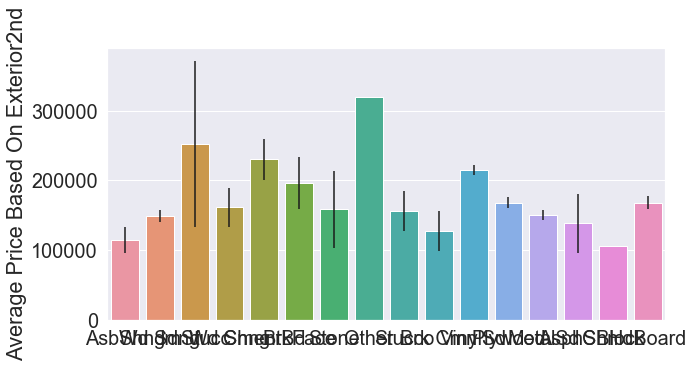

F Value: 17.50083957136983 --- p Value: 4.842185670698891e-43
Exterior2nd --- F_stat: 66.35533015444817
Exterior2nd --- eta_squared: 0.15382986012502303
Foundation: Stone_std : 78557.70441253147
Foundation: PConc_std : 86865.97728333822
Foundation: BrkTil_std : 54592.39303218437
Foundation: Slab_std : 34213.98093941753
Foundation: CBlock_std : 48295.04175855146
Foundation: Wood_std : 56695.09091035425


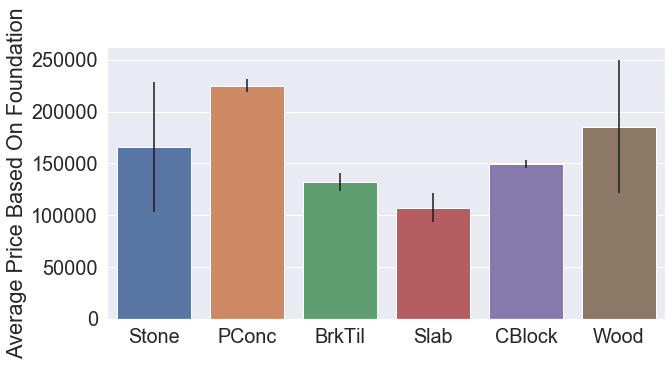

F Value: 100.25385058740892 --- p Value: 5.791895002231574e-91
Foundation --- F_stat: 125.83444120844639
Foundation --- eta_squared: 0.25636840153041784
GarageType: BuiltIn_std : 102230.85439399551
GarageType: NoGar_std : 32815.02338915613
GarageType: 2Types_std : 34917.06841455431
GarageType: Basment_std : 63967.283573586465
GarageType: Detchd_std : 41391.54995285074
GarageType: CarPort_std : 24638.183681251972
GarageType: Attchd_std : 77146.62177790103


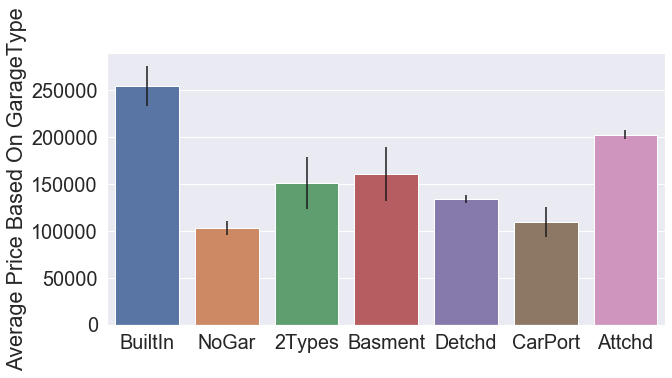

F Value: 80.37999183318554 --- p Value: 6.117025805439062e-87
GarageType --- F_stat: 121.15084810774681
GarageType --- eta_squared: 0.2492042305042896
Heating: OthW_std : 5303.300858899106
Heating: Wall_std : 4509.988913511873
Heating: Floor_std : nan
Heating: GasW_std : 78547.57532353168
Heating: Grav_std : 28066.570523531744
Heating: GasA_std : 79262.87358660204


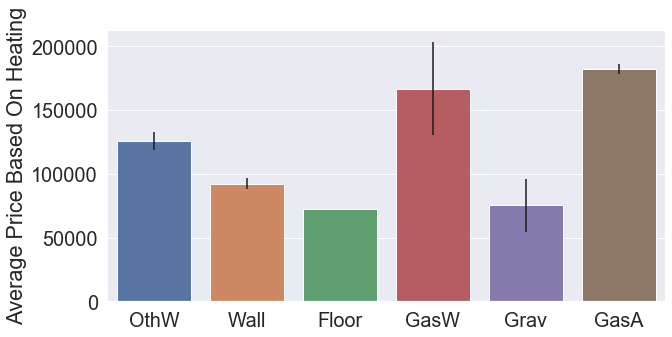

F Value: 4.259818559406288 --- p Value: 0.000753472106445497
Heating --- F_stat: 5.3467461328542605
Heating --- eta_squared: 0.0144371354263157
LotConfig: Corner_std : 84466.04122160583
LotConfig: FR3_std : 78379.2223743002
LotConfig: CulDSac_std : 93117.54658611523
LotConfig: Inside_std : 76426.80578739091
LotConfig: FR2_std : 62788.92682933992


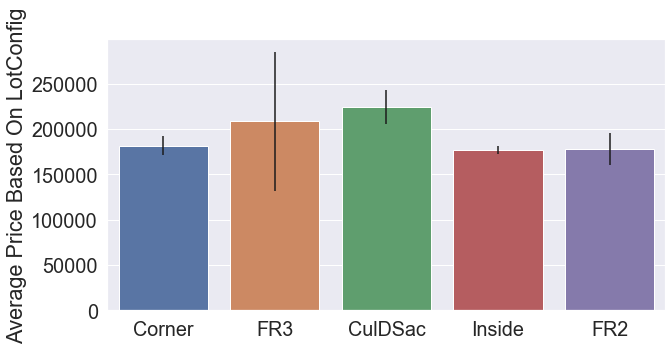

F Value: 7.80995412346779 --- p Value: 3.163167473604189e-06
LotConfig --- F_stat: 7.8367924601353565
LotConfig --- eta_squared: 0.021019364538064744
LotShape: IR3_std : 82540.33485548478
LotShape: Reg_std : 69673.42721450885
LotShape: IR1_std : 85858.4895587145
LotShape: IR2_std : 99669.42736209439


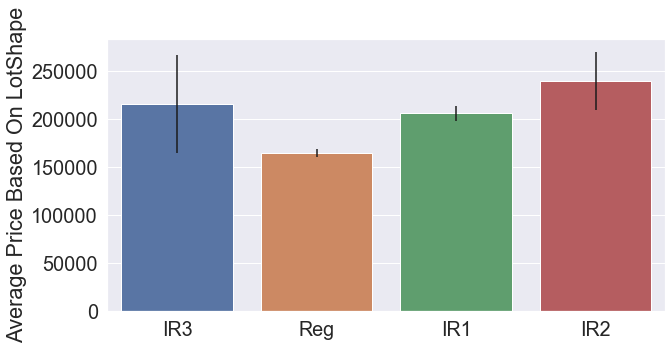

F Value: 40.13285166226296 --- p Value: 6.447523852011766e-25
LotShape --- F_stat: 30.182330087842512
LotShape --- eta_squared: 0.07637570753025578
MSSubClass: 160_std : 34587.54226616608
MSSubClass: 70_std : 58206.545761635905
MSSubClass: 40_std : 75747.79974802349
MSSubClass: 75_std : 100556.76257716335
MSSubClass: 45_std : 20231.723888862052
MSSubClass: 80_std : 38197.80877116291
MSSubClass: 50_std : 54851.98370745201
MSSubClass: 20_std : 78782.18996685588
MSSubClass: 85_std : 19629.942220468896
MSSubClass: 180_std : 29474.282575379733
MSSubClass: 30_std : 24857.110083484607
MSSubClass: 120_std : 58221.490908909596
MSSubClass: 90_std : 27833.249196899593
MSSubClass: 60_std : 86579.90996572845
MSSubClass: 190_std : 35439.097670202624


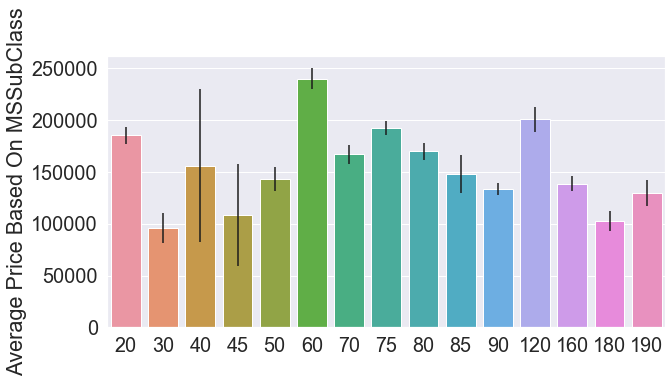

F Value: 33.73207641062385 --- p Value: 8.66216626609302e-79
MSSubClass --- F_stat: 119.28782743225182
MSSubClass --- eta_squared: 0.2463159728175664
MSZoning: FV_std : 52369.662067447534
MSZoning: C (all)_std : 33791.092031283435
MSZoning: RL_std : 80766.34131930246
MSZoning: RH_std : 35714.11843491777
MSZoning: RM_std : 48521.689832548946


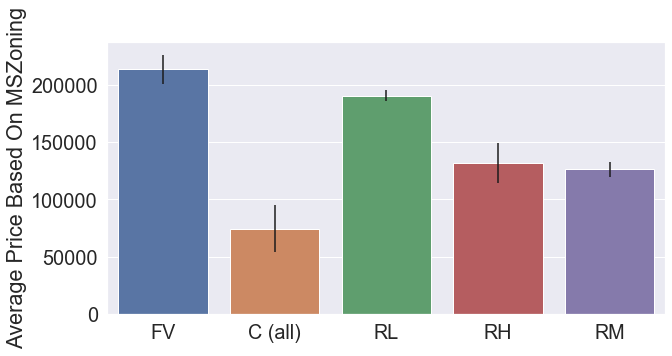

F Value: 43.84028167245718 --- p Value: 8.817633866272648e-35
MSZoning --- F_stat: 43.99093560044522
MSZoning --- eta_squared: 0.10755968344624962
MasVnrType: BrkFace_std : 81214.29355409252
MasVnrType: Stone_std : 99940.15657744593
MasVnrType: BrkCmn_std : 46187.58363219441
MasVnrType: None_std : 61491.68896858725


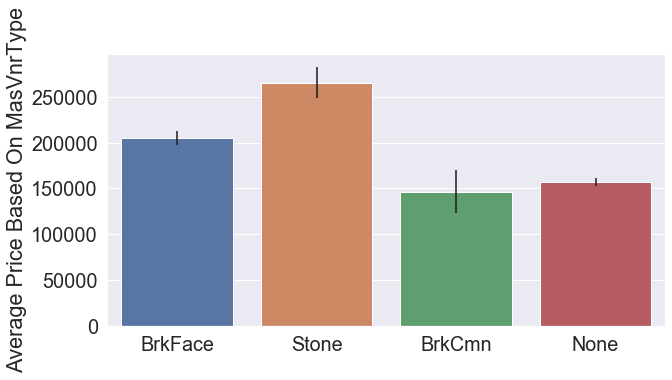

F Value: 108.9113045588765 --- p Value: 1.2797035312662622e-63
MasVnrType --- F_stat: 81.90788365915793
MasVnrType --- eta_squared: 0.18327688230420677
MiscFeature: Othr_std : 55154.32893255071
MiscFeature: None_std : 80084.13656997337
MiscFeature: TenC_std : nan
MiscFeature: Shed_std : 51642.728055690604
MiscFeature: Gar2_std : 27223.611075682078


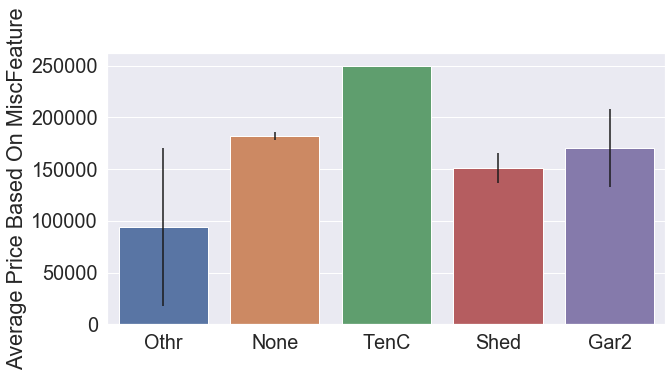

F Value: 2.593622339924057 --- p Value: 0.0350036718754261
MiscFeature --- F_stat: 2.6025351335481792
MiscFeature --- eta_squared: 0.007079752947131906
MiscVal: 0_std : 80057.17361603778
MiscVal: 15500_std : nan
MiscVal: 400_std : 37857.92399341133
MiscVal: 1300_std : nan
MiscVal: 800_std : nan
MiscVal: 3500_std : nan
MiscVal: 1200_std : 22980.970388562793
MiscVal: 560_std : nan
MiscVal: 54_std : nan
MiscVal: 700_std : 34450.297531371194
MiscVal: 450_std : 36700.576176221904
MiscVal: 2500_std : nan
MiscVal: 2000_std : 70324.03572037088
MiscVal: 600_std : 29818.17119364186
MiscVal: 350_std : nan
MiscVal: 480_std : 45961.94077712559
MiscVal: 620_std : nan
MiscVal: 8300_std : nan
MiscVal: 500_std : 56351.2453912321
MiscVal: 1400_std : nan
MiscVal: 1150_std : nan


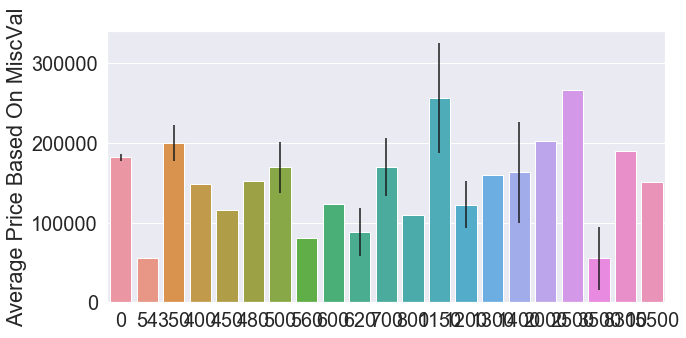

F Value: 0.9881186602702414 --- p Value: 0.4736397759420298
MiscVal --- F_stat: 5.012693694072238
MiscVal --- eta_squared: 0.013547356011095944
Neighborhood: BrDale_std : 14330.176493446734
Neighborhood: NridgHt_std : 96392.54495442321
Neighborhood: Blueste_std : 19091.883092036784
Neighborhood: NWAmes_std : 37172.218106451175
Neighborhood: Blmngtn_std : 30393.229219026627
Neighborhood: Sawyer_std : 22345.129156542916
Neighborhood: NAmes_std : 33075.34545026377
Neighborhood: NPkVill_std : 9377.31452910575
Neighborhood: ClearCr_std : 50231.53899282105
Neighborhood: Crawfor_std : 68866.39547212514
Neighborhood: StoneBr_std : 112969.67664045958
Neighborhood: Somerst_std : 56177.555888212046
Neighborhood: NoRidge_std : 121412.65864036564
Neighborhood: IDOTRR_std : 33376.71011693228
Neighborhood: OldTown_std : 52650.58318492048
Neighborhood: SWISU_std : 32622.91767924302
Neighborhood: Veenker_std : 72369.31795877437
Neighborhood: Gilbert_std : 35986.779085100556
Neighborhood: BrkSide_std : 

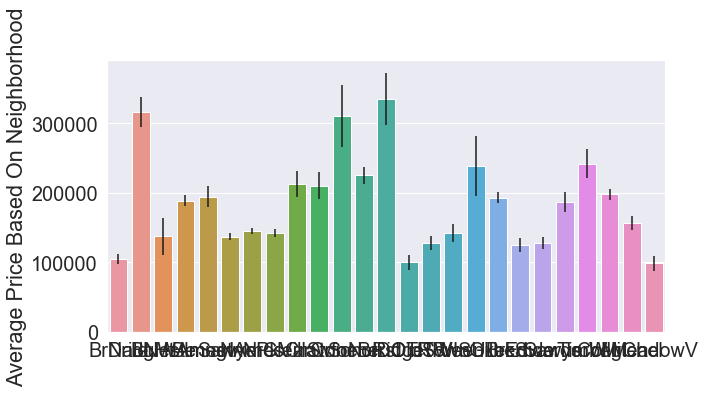

F Value: 71.78486512058281 --- p Value: 1.5586002827707996e-225
Neighborhood --- F_stat: 438.2128359257014
Neighborhood --- eta_squared: 0.5455749908095633
RoofMatl: Tar&Grv_std : 65430.14171965812
RoofMatl: WdShngl_std : 206969.0194207819
RoofMatl: ClyTile_std : nan
RoofMatl: Membran_std : nan
RoofMatl: WdShake_std : 36218.77965917681
RoofMatl: Metal_std : nan
RoofMatl: CompShg_std : 77722.38863637004
RoofMatl: Roll_std : nan


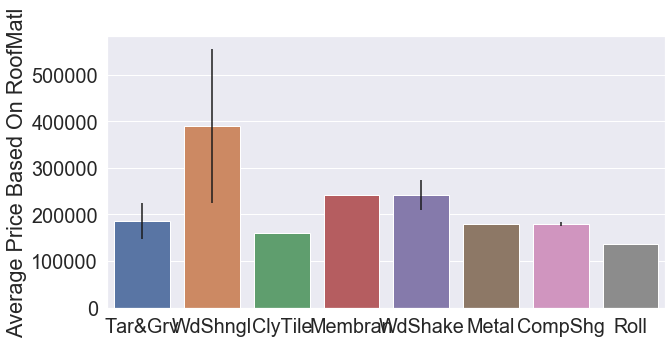

F Value: 6.727304893420314 --- p Value: 7.231444779987188e-08
RoofMatl --- F_stat: 11.837647394461188
RoofMatl --- eta_squared: 0.031413123043635506
RoofStyle: Gambrel_std : 67013.527806637
RoofStyle: Gable_std : 66331.23729616521
RoofStyle: Shed_std : 49497.474683058324
RoofStyle: Hip_std : 111549.60356336068
RoofStyle: Mansard_std : 58057.624626621735
RoofStyle: Flat_std : 62522.96351474925


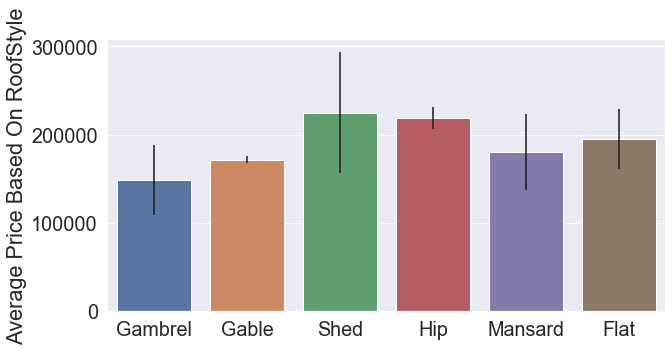

F Value: 17.805497229144205 --- p Value: 3.653523047099125e-17
RoofStyle --- F_stat: 22.348715591834587
RoofStyle --- eta_squared: 0.057696630128151405
SaleType: ConLD_std : 53876.56064664031
SaleType: WD_std : 71129.68624501117
SaleType: Con_std : 76933.21779309637
SaleType: ConLI_std : 145282.51959544205
SaleType: ConLw_std : 67291.90144437888
SaleType: CWD_std : 86421.48652582489
SaleType: COD_std : 47098.29431351549
SaleType: Oth_std : 28441.035494510394
SaleType: New_std : 103239.58215834062


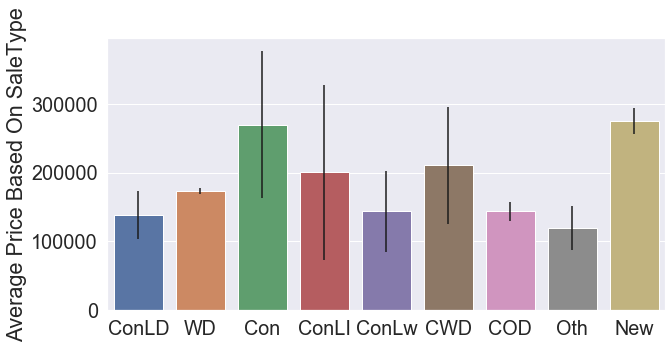

F Value: 28.863054116984085 --- p Value: 5.039766889462451e-42
SaleType --- F_stat: 58.084161336349695
SaleType --- eta_squared: 0.13728748697856397
YearBuilt: 1872_std : nan
YearBuilt: 1875_std : nan
YearBuilt: 1880_std : 93021.39911645779
YearBuilt: 1882_std : nan
YearBuilt: 1885_std : 15909.90257669732
YearBuilt: 1890_std : 24465.894629054543
YearBuilt: 1892_std : 259861.7420860562
YearBuilt: 1893_std : nan
YearBuilt: 1898_std : nan
YearBuilt: 1900_std : 27666.52234580832
YearBuilt: 1904_std : nan
YearBuilt: 1905_std : nan
YearBuilt: 1906_std : nan
YearBuilt: 1908_std : 79903.06627407987
YearBuilt: 1910_std : 29370.118233654146
YearBuilt: 1911_std : nan
YearBuilt: 1912_std : 15971.954587129696
YearBuilt: 1913_std : nan
YearBuilt: 1914_std : 50088.76017203289
YearBuilt: 1915_std : 28115.335994000776
YearBuilt: 1916_std : 35932.357085422125
YearBuilt: 1917_std : nan
YearBuilt: 1918_std : 53925.812133761276
YearBuilt: 1919_std : 34972.608328995615
YearBuilt: 1920_std : 47291.4768389526

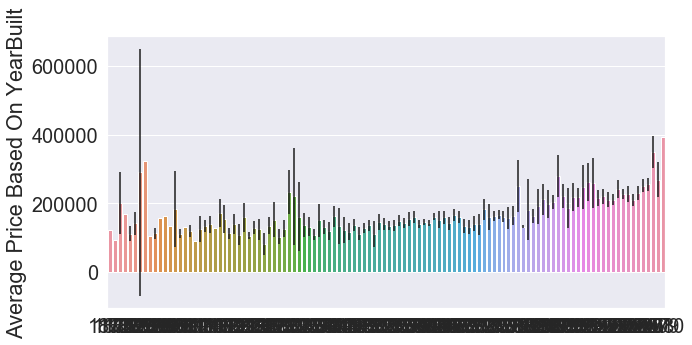

F Value: 9.52631076219757 --- p Value: 9.128103646615598e-107
YearBuilt --- F_stat: 286.319347979561
YearBuilt --- eta_squared: 0.4395990210343835
YearRemodAdd: 1950_std : 39306.143136512546
YearRemodAdd: 1951_std : 18694.09443291294
YearRemodAdd: 1952_std : 42510.18007254262
YearRemodAdd: 1953_std : 48205.07580466328
YearRemodAdd: 1954_std : 19492.038385955442
YearRemodAdd: 1955_std : 18922.56882960427
YearRemodAdd: 1956_std : 14800.188624924122
YearRemodAdd: 1957_std : 26324.09492798903
YearRemodAdd: 1958_std : 30081.29144897365
YearRemodAdd: 1959_std : 21141.132963190983
YearRemodAdd: 1960_std : 32542.29503137557
YearRemodAdd: 1961_std : 18686.89260838042
YearRemodAdd: 1962_std : 22575.93778856079
YearRemodAdd: 1963_std : 18992.842781507905
YearRemodAdd: 1964_std : 24191.809282557522
YearRemodAdd: 1965_std : 65211.78124289617
YearRemodAdd: 1966_std : 49600.48543349244
YearRemodAdd: 1967_std : 25323.77461213199
YearRemodAdd: 1968_std : 35952.91765956268
YearRemodAdd: 1969_std : 35230

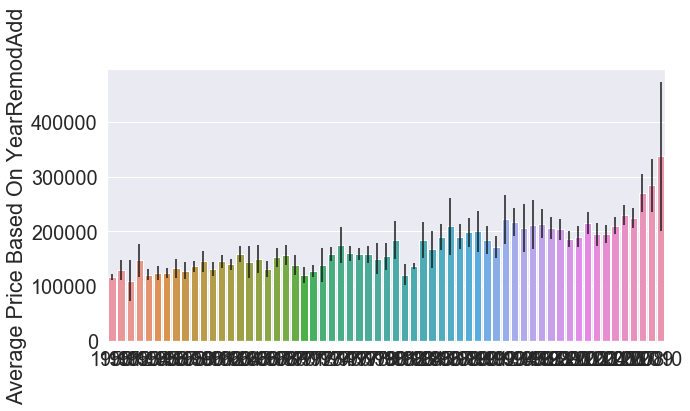

F Value: 10.477192602730359 --- p Value: 2.354747702062579e-76
YearRemodAdd --- F_stat: 164.01037760074448
YearRemodAdd --- eta_squared: 0.310032438710493
YrSold: 2006_std : 79426.83885500091
YrSold: 2007_std : 85768.17141041653
YrSold: 2008_std : 69735.61068479427
YrSold: 2009_std : 80879.23731137285
YrSold: 2010_std : 80451.28008484298


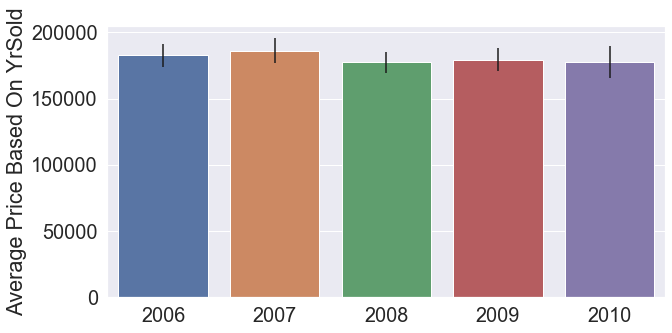

F Value: 0.6455252211679311 --- p Value: 0.6300887663573457
YrSold --- F_stat: 0.6477435214114716
YrSold --- eta_squared: 0.0017714960159736697


In [49]:
anova_results = pd.DataFrame(columns = ['Parameter', 'f_value', 'p_value', 'F_stat', 'eta_squared'])
for par in nominal_list:
    temp_result = get_Fstats(par)
    anova_results = anova_results.append(temp_result, ignore_index = True)
reject_anova = anova_results[anova_results['p_value'] < 0.05].copy()
fail_anova = anova_results[anova_results['p_value'] > 0.05].copy()

In [50]:
print(reject_anova.to_string())
print(fail_anova.to_string())

       Parameter     f_value        p_value      F_stat  eta_squared
0          Alley   15.176614   2.996380e-07    7.603931     0.020408
1       BldgType   13.011077   2.056736e-10   13.055789     0.034534
2     Condition1    6.118017   8.904549e-08   12.311930     0.032631
3     Condition2    2.073899   4.342566e-02    3.649319     0.009899
4    Exterior1st   18.611743   2.586089e-43   65.817305     0.152773
5    Exterior2nd   17.500840   4.842186e-43   66.355330     0.153830
6     Foundation  100.253851   5.791895e-91  125.834441     0.256368
7     GarageType   80.379992   6.117026e-87  121.150848     0.249204
8        Heating    4.259819   7.534721e-04    5.346746     0.014437
9      LotConfig    7.809954   3.163167e-06    7.836792     0.021019
10      LotShape   40.132852   6.447524e-25   30.182330     0.076376
11    MSSubClass   33.732076   8.662166e-79  119.287827     0.246316
12      MSZoning   43.840282   8.817634e-35   43.990936     0.107560
13    MasVnrType  108.911305   1.2

In [51]:
high_effect = reject_anova[reject_anova['eta_squared'] > 0.14]
med_effect = reject_anova[(reject_anova['eta_squared'] > 0.06) & (reject_anova['eta_squared'] < 0.14)]
low_effect = reject_anova[(reject_anova['eta_squared'] > 0.01) & (reject_anova['eta_squared'] < 0.06)]

In [52]:
print(high_effect.to_string())
print(med_effect.to_string())
print(low_effect.to_string())

       Parameter     f_value        p_value      F_stat  eta_squared
4    Exterior1st   18.611743   2.586089e-43   65.817305     0.152773
5    Exterior2nd   17.500840   4.842186e-43   66.355330     0.153830
6     Foundation  100.253851   5.791895e-91  125.834441     0.256368
7     GarageType   80.379992   6.117026e-87  121.150848     0.249204
11    MSSubClass   33.732076   8.662166e-79  119.287827     0.246316
13    MasVnrType  108.911305   1.279704e-63   81.907884     0.183277
16  Neighborhood   71.784865  1.558600e-225  438.212836     0.545575
20     YearBuilt    9.526311  9.128104e-107  286.319348     0.439599
21  YearRemodAdd   10.477193   2.354748e-76  164.010378     0.310032
   Parameter    f_value       p_value     F_stat  eta_squared
10  LotShape  40.132852  6.447524e-25  30.182330     0.076376
12  MSZoning  43.840282  8.817634e-35  43.990936     0.107560
19  SaleType  28.863054  5.039767e-42  58.084161     0.137287
     Parameter    f_value       p_value     F_stat  eta_square

From this group of parameters, the most important variables were Neighborhood, Year Built, Year remodeled, Garage Type, and MSSubclass.

Alley, BuildingType, Condition, Heating, LotConfig, RoofMaterial, and  RoofStyle had a pretty small effect on the price

In [53]:
continuous_list = list(var_class[var_class['Variable_Type'] == 'Continuous']['DType'].values) + ['SalePrice']

In [54]:
continuous_df = data[continuous_list].copy()

X = 1stFlrSF --- Y = SalePrice
X = 2ndFlrSF --- Y = SalePrice
X = 3SsnPorch --- Y = SalePrice
X = BsmtFinSF1 --- Y = SalePrice
X = BsmtFinSF2 --- Y = SalePrice
X = BsmtUnfSF --- Y = SalePrice
X = EnclosedPorch --- Y = SalePrice
X = GarageArea --- Y = SalePrice
X = GrLivArea --- Y = SalePrice
X = LotArea --- Y = SalePrice
X = LotFrontage --- Y = SalePrice
X = LowQualFinSF --- Y = SalePrice
X = MasVnrArea --- Y = SalePrice
X = OpenPorchSF --- Y = SalePrice
X = PoolArea --- Y = SalePrice
X = ScreenPorch --- Y = SalePrice
X = TotalBsmtSF --- Y = SalePrice
X = WoodDeckSF --- Y = SalePrice
X = SalePrice --- Y = SalePrice


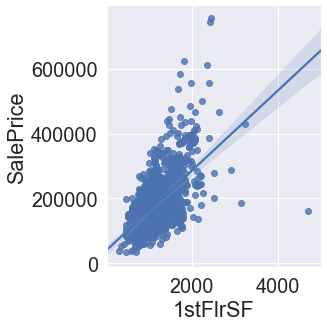

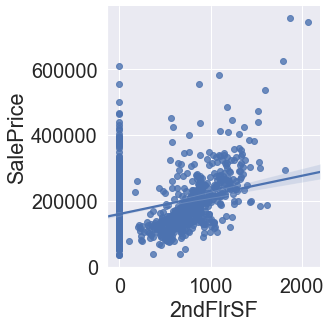

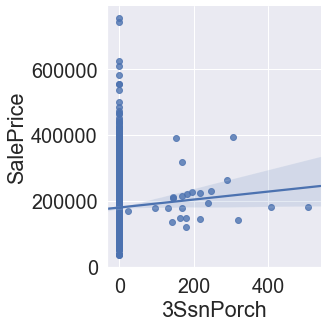

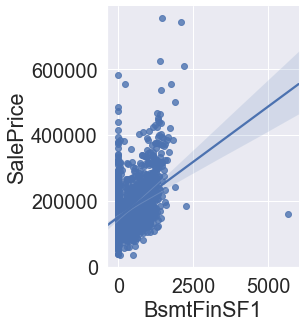

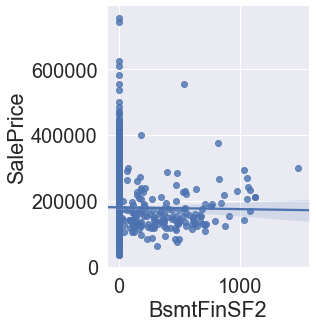

...

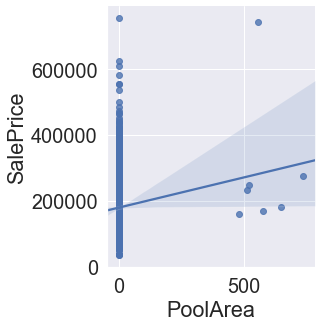

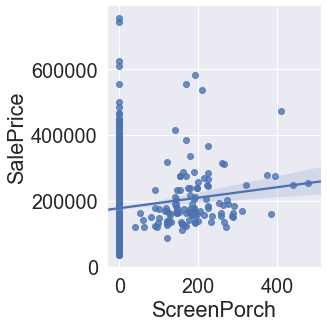

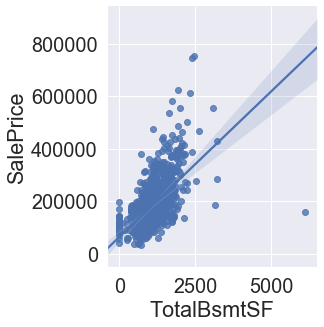

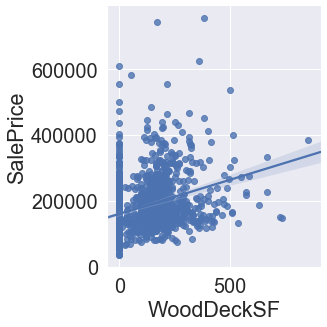

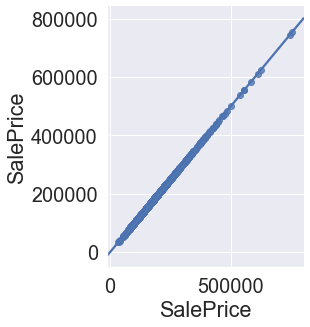

In [55]:
for metric in continuous_list:
    print('X = ' + metric + ' --- Y = SalePrice')
    sns.lmplot(x = metric, y = 'SalePrice', data = continuous_df)

There's a lot of zeros in many of these datasets because plenty of houses don't have a 2nd floor, basement etc. Therefore, the regression line that we see can often be fitting to the zeros when it shouldn't be. 

X = 1stFlrSF --- Y = SalePrice --- Filtered Zeros
X = 2ndFlrSF --- Y = SalePrice --- Filtered Zeros
X = 3SsnPorch --- Y = SalePrice --- Filtered Zeros
X = BsmtFinSF1 --- Y = SalePrice --- Filtered Zeros
X = BsmtFinSF2 --- Y = SalePrice --- Filtered Zeros
X = BsmtUnfSF --- Y = SalePrice --- Filtered Zeros
X = EnclosedPorch --- Y = SalePrice --- Filtered Zeros
X = GarageArea --- Y = SalePrice --- Filtered Zeros
X = GrLivArea --- Y = SalePrice --- Filtered Zeros
X = LotArea --- Y = SalePrice --- Filtered Zeros
X = LotFrontage --- Y = SalePrice --- Filtered Zeros


C:\Users\daniel_lee\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\axisgrid.py:311: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)
C:\Users\daniel_lee\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


X = LowQualFinSF --- Y = SalePrice --- Filtered Zeros
X = MasVnrArea --- Y = SalePrice --- Filtered Zeros
X = OpenPorchSF --- Y = SalePrice --- Filtered Zeros
X = PoolArea --- Y = SalePrice --- Filtered Zeros
X = ScreenPorch --- Y = SalePrice --- Filtered Zeros
X = TotalBsmtSF --- Y = SalePrice --- Filtered Zeros
X = WoodDeckSF --- Y = SalePrice --- Filtered Zeros
X = SalePrice --- Y = SalePrice --- Filtered Zeros


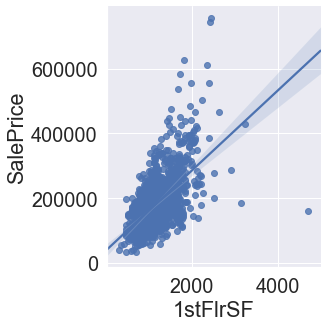

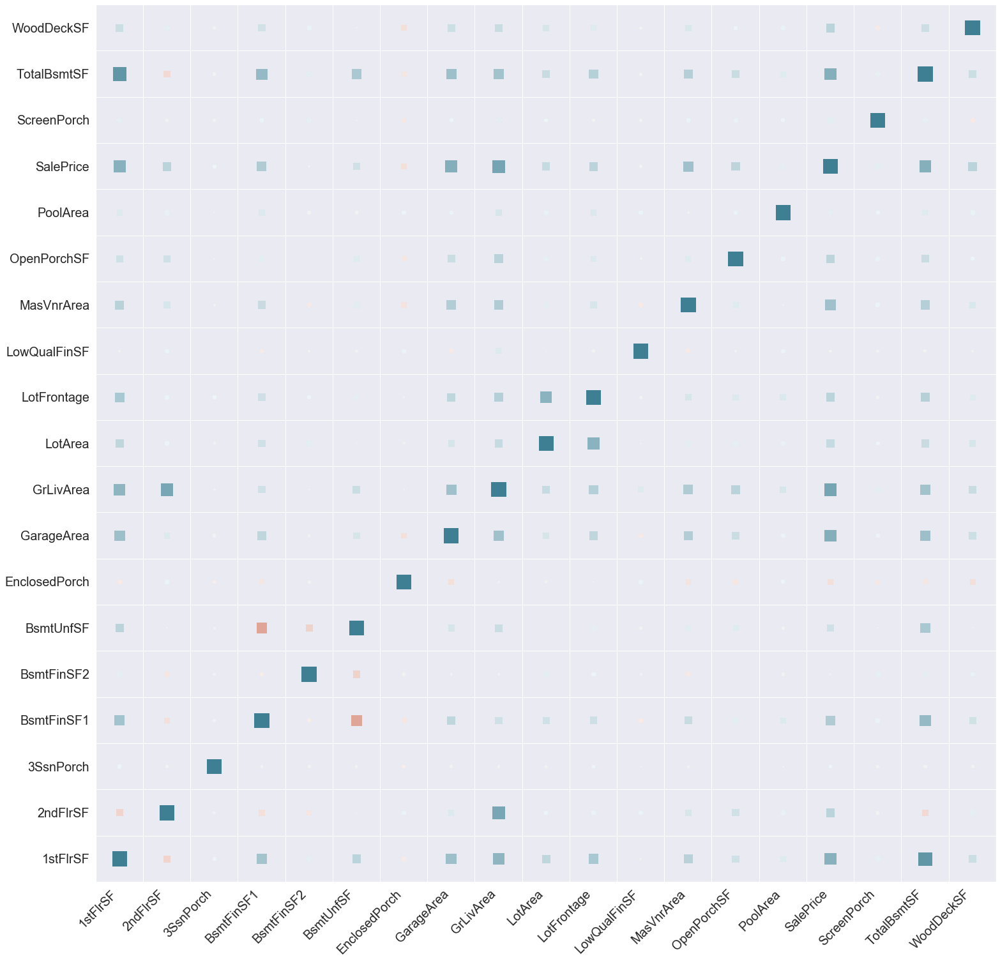

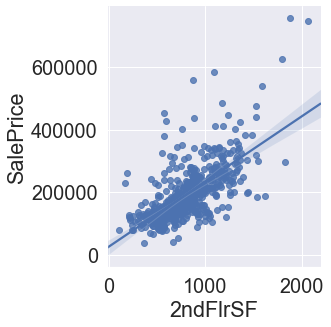

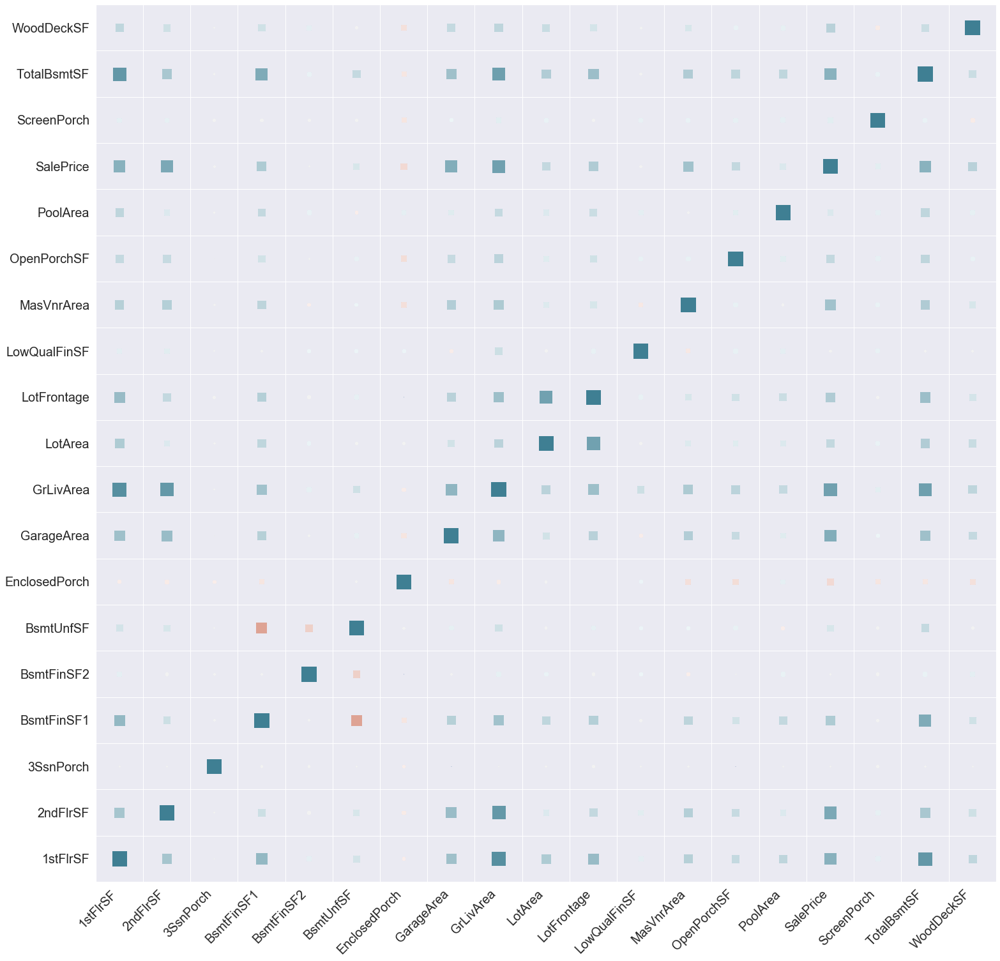

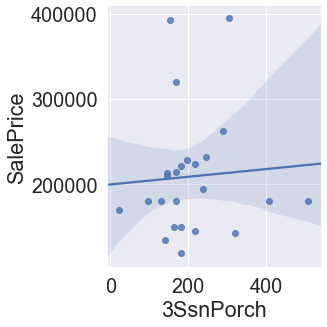

...

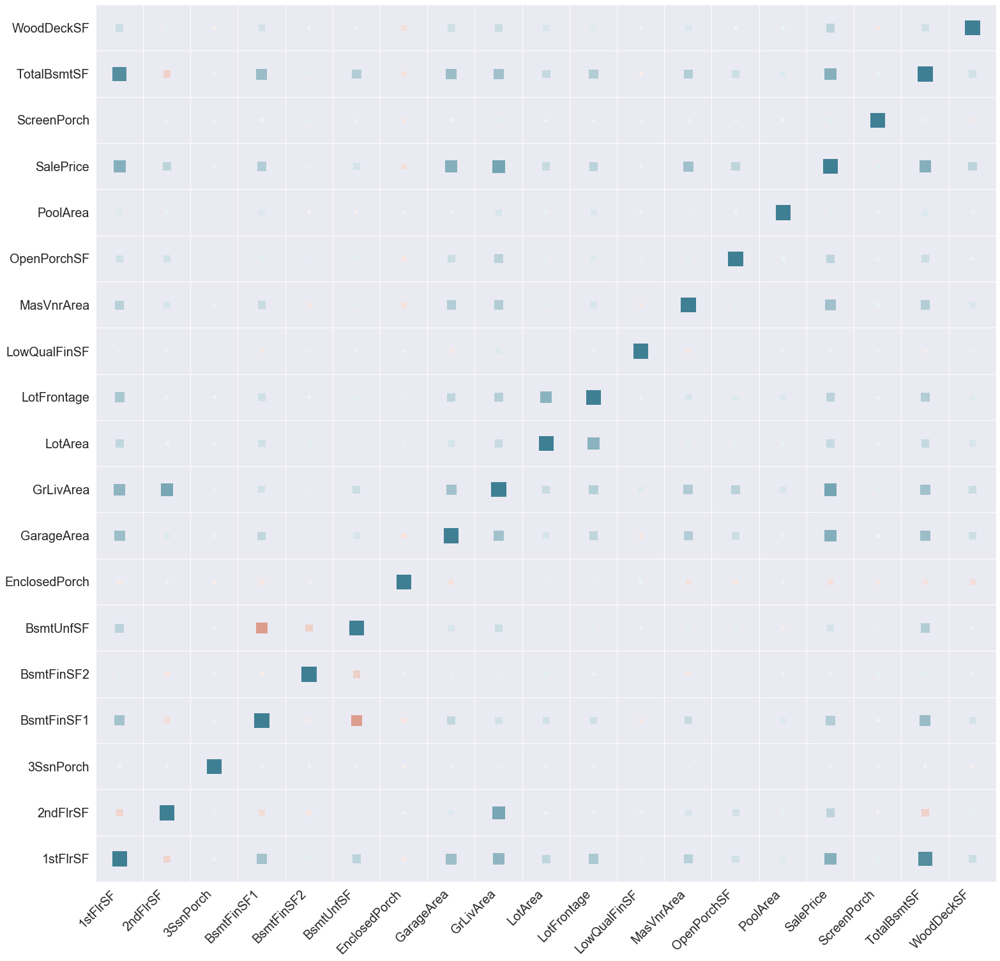

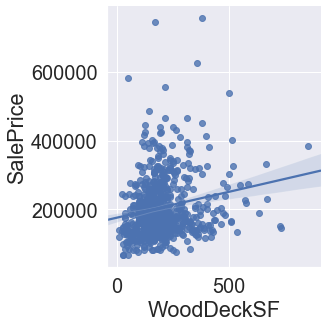

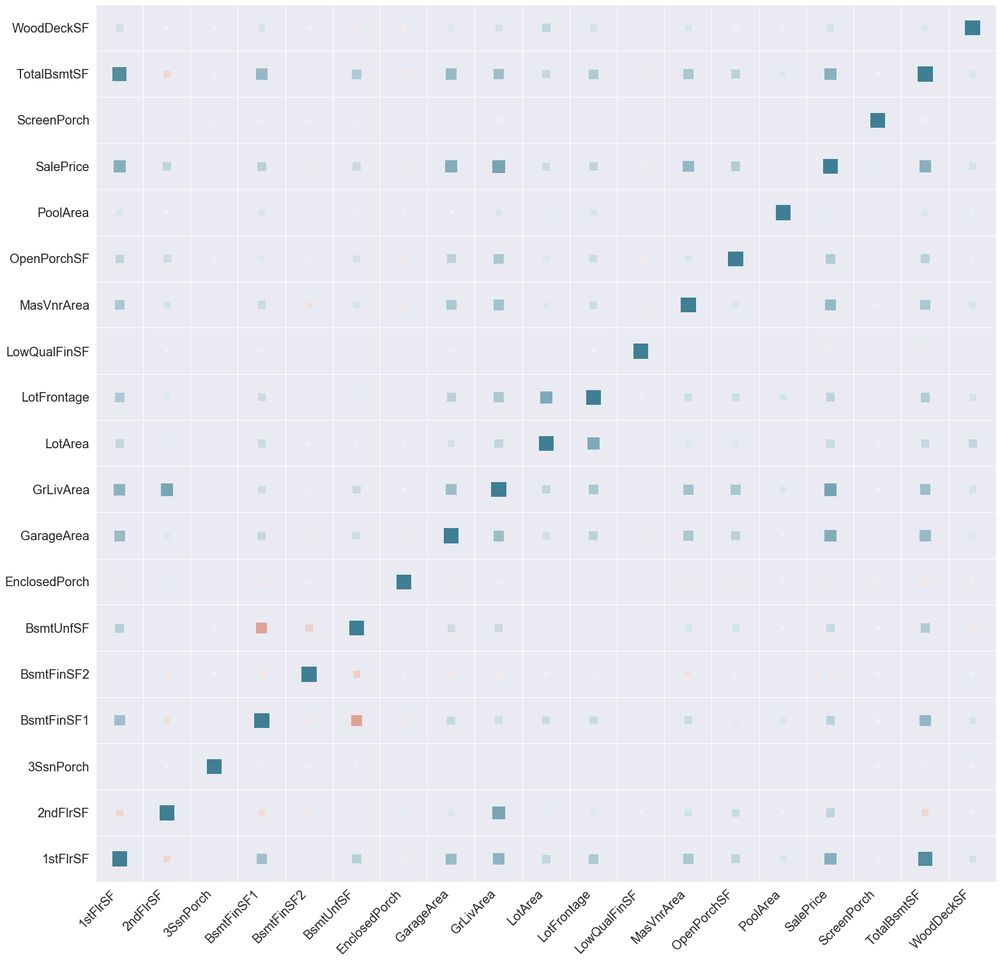

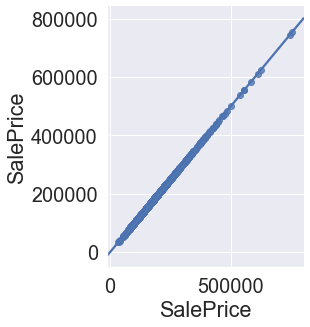

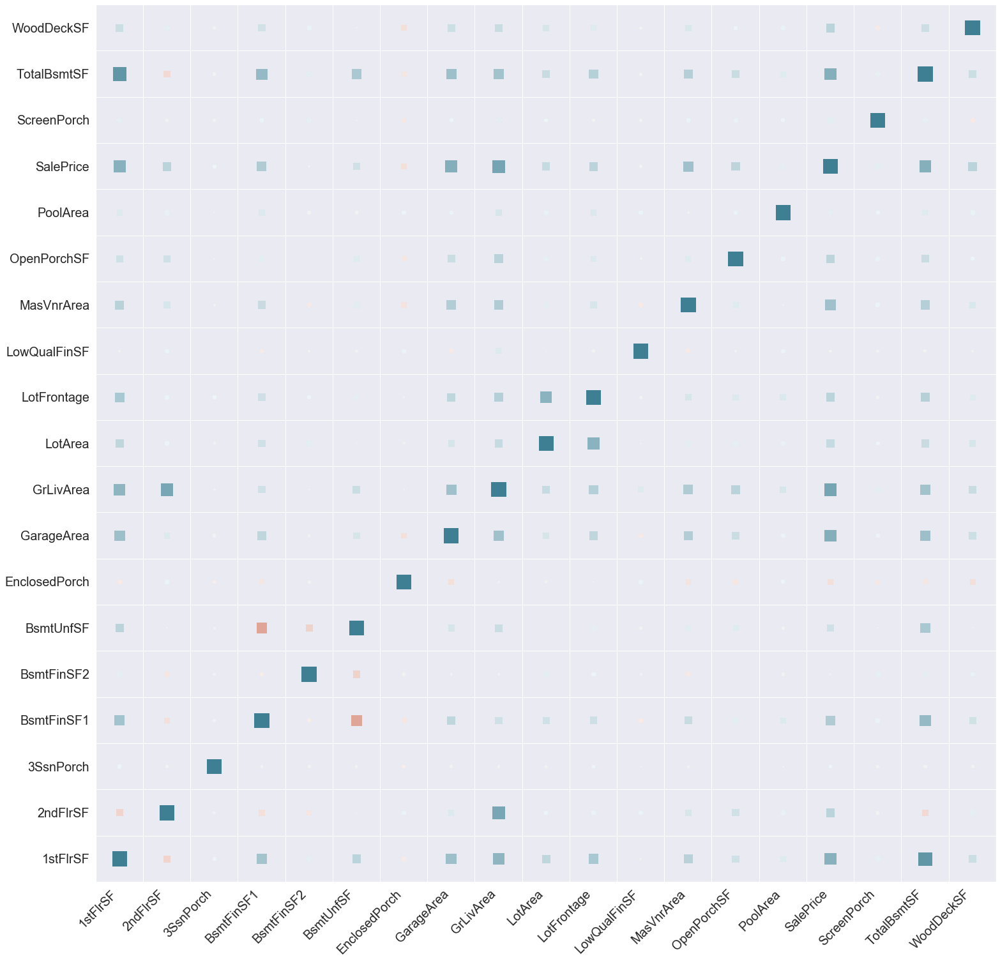

In [56]:
for metric in continuous_list:
    print('X = ' + metric + ' --- Y = SalePrice --- Filtered Zeros')
    temp_df = continuous_df[continuous_df[metric] > 0].copy()
    sns.lmplot(x = metric, y = 'SalePrice', data = temp_df)
    temp_corr = temp_df.corr()
    corr_melt = pd.melt(temp_corr.reset_index(), id_vars = 'index')
    corr_melt.columns = ['x', 'y', 'value']
    corr_melt['value'].fillna(0, inplace = True)
    heatmap(
            x = corr_melt['x'],
            y = corr_melt['y'],
            size = corr_melt['value'].abs(),
            color = corr_melt['value']
            )

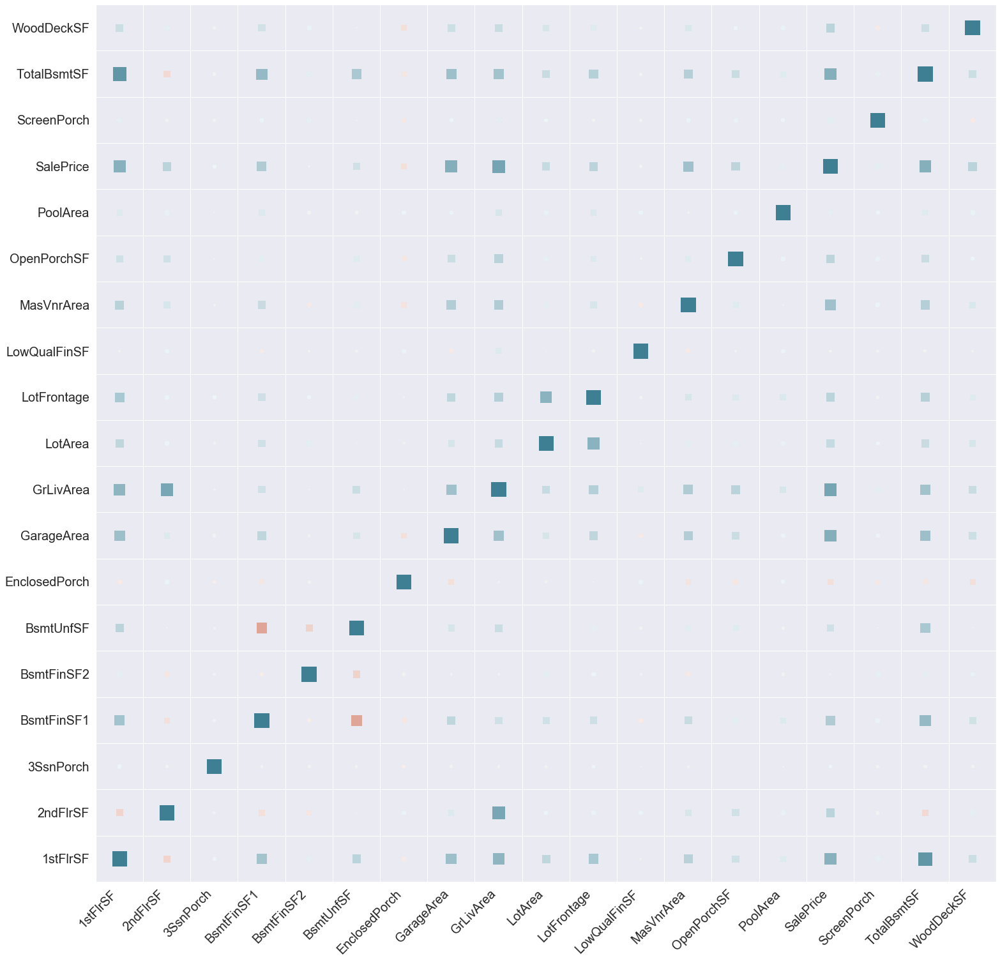

In [57]:
continuous_corr = continuous_df.corr()
corr = pd.melt(continuous_corr.reset_index(), id_vars = 'index')
corr.columns = ['x', 'y', 'value']
corr = pd.concat([corr.iloc[[0],:], corr.drop(0, axis = 0)], axis = 0)
heatmap(
        x = corr['x'],
        y = corr['y'],
        size = corr['value'].abs(),
        color = corr['value']
        )

In [58]:
p_val_df = pd.DataFrame(columns = ['Parameter', 'Coefficient', 'p-value'])

In [59]:
for par in continuous_list:
    c, p = stats.pearsonr(continuous_df[par], continuous_df['SalePrice'])
    p_val_df.loc[len(p_val_df)] = [par, c, p]

In [60]:
print(p_val_df)

        Parameter  Coefficient        p-value
0        1stFlrSF     0.605852  5.394711e-147
1        2ndFlrSF     0.319334   5.764335e-36
2       3SsnPorch     0.044584   8.858170e-02
3      BsmtFinSF1     0.386420   3.394110e-53
4      BsmtFinSF2    -0.011378   6.639987e-01
5       BsmtUnfSF     0.214479   1.182976e-16
6   EnclosedPorch    -0.128578   8.255770e-07
7      GarageArea     0.623431  5.265038e-158
8       GrLivArea     0.708624  4.518034e-223
9         LotArea     0.263843   1.123139e-24
10    LotFrontage     0.321715   1.655321e-36
11   LowQualFinSF    -0.025606   3.282073e-01
12     MasVnrArea     0.472614   4.100461e-82
13    OpenPorchSF     0.315856   3.493374e-35
14       PoolArea     0.092404   4.073490e-04
15    ScreenPorch     0.111447   1.972140e-05
16    TotalBsmtSF     0.613581  9.484229e-152
17     WoodDeckSF     0.324413   3.972217e-37
18      SalePrice     1.000000   0.000000e+00


We will use a 95% confidence level that the parameter is statistically significant. 

In [61]:
sign_df = p_val_df[p_val_df['p-value'] < 0.05].copy()
insign_df = p_val_df[p_val_df['p-value'] >= 0.05].copy()

In [62]:
print(sign_df.to_string())
print(insign_df.to_string())

        Parameter  Coefficient        p-value
0        1stFlrSF     0.605852  5.394711e-147
1        2ndFlrSF     0.319334   5.764335e-36
3      BsmtFinSF1     0.386420   3.394110e-53
5       BsmtUnfSF     0.214479   1.182976e-16
6   EnclosedPorch    -0.128578   8.255770e-07
7      GarageArea     0.623431  5.265038e-158
8       GrLivArea     0.708624  4.518034e-223
9         LotArea     0.263843   1.123139e-24
10    LotFrontage     0.321715   1.655321e-36
12     MasVnrArea     0.472614   4.100461e-82
13    OpenPorchSF     0.315856   3.493374e-35
14       PoolArea     0.092404   4.073490e-04
15    ScreenPorch     0.111447   1.972140e-05
16    TotalBsmtSF     0.613581  9.484229e-152
17     WoodDeckSF     0.324413   3.972217e-37
18      SalePrice     1.000000   0.000000e+00
       Parameter  Coefficient   p-value
2      3SsnPorch     0.044584  0.088582
4     BsmtFinSF2    -0.011378  0.663999
11  LowQualFinSF    -0.025606  0.328207


In [63]:
p_val_df = pd.DataFrame(columns = ['Parameter', 'Coefficient', 'p-value'])
for par in continuous_list:
    c, p = stats.pearsonr(continuous_df[continuous_df[par] > 0][par], continuous_df[continuous_df[par] > 0]['SalePrice'])
    p_val_df.loc[len(p_val_df)] = [par, c, p]

In [64]:
sign_df = p_val_df[p_val_df['p-value'] < 0.05].copy()
insign_df = p_val_df[p_val_df['p-value'] >= 0.05].copy()

In [65]:
print(sign_df.to_string())
print(insign_df.to_string())

        Parameter  Coefficient        p-value
0        1stFlrSF     0.605852  5.394711e-147
1        2ndFlrSF     0.673305   1.533362e-84
3      BsmtFinSF1     0.471690   3.740433e-56
4      BsmtFinSF2     0.198956   9.949210e-03
5       BsmtUnfSF     0.169261   4.378835e-10
6   EnclosedPorch     0.241279   4.467346e-04
7      GarageArea     0.608405  2.085048e-140
8       GrLivArea     0.708624  4.518034e-223
9         LotArea     0.263843   1.123139e-24
10    LotFrontage     0.321715   1.655321e-36
12     MasVnrArea     0.434090   1.485356e-28
13    OpenPorchSF     0.086453   1.420079e-02
15    ScreenPorch     0.255430   5.651662e-03
16    TotalBsmtSF     0.609681  1.356408e-145
17     WoodDeckSF     0.193706   2.454873e-07
18      SalePrice     1.000000   0.000000e+00
       Parameter  Coefficient   p-value
2      3SsnPorch     0.063932  0.766629
11  LowQualFinSF     0.300075  0.136380
14      PoolArea    -0.014092  0.976080


Now that we've evaluated and tested for the continuous variables, we have count variables to do now.

In [66]:
count_list = list(var_class[var_class['Variable_Type'] == 'Count']['DType'].values) + ['SalePrice']

In [67]:
count_df = data[count_list].copy()

In [68]:
count_pval_df = pd.DataFrame(columns = ['Parameter', 'Coefficient', 'p-value'])
for par in count_df:
    c, p = stats.pearsonr(count_df[par], count_df['SalePrice'])
    count_pval_df.loc[len(count_pval_df)] = [par, c, p]

In [69]:
print(count_pval_df.to_string())

      Parameter  Coefficient        p-value
0  BedroomAbvGr     0.168213   9.927497e-11
1  BsmtFullBath     0.227122   1.550344e-18
2  BsmtHalfBath    -0.016844   5.201536e-01
3    Fireplaces     0.466929   6.141487e-80
4      FullBath     0.560664  1.236470e-121
5      HalfBath     0.284108   1.650473e-28
6  KitchenAbvGr    -0.135907   1.860426e-07
7  TotRmsAbvGrd     0.533723  2.772281e-108
8     SalePrice     1.000000   0.000000e+00


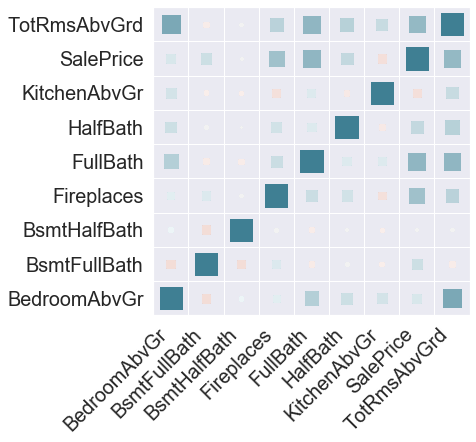

In [70]:
count_corr = count_df.corr()
corr = pd.melt(count_corr.reset_index(), id_vars = 'index')
corr.columns = ['x', 'y', 'value']
heatmap(
        x = corr['x'],
        y = corr['y'],
        size = corr['value'].abs(),
        color = corr['value']
        )

ToDo: Test the tolerance intervals: https://blog.minitab.com/blog/adventures-in-statistics-2/when-should-i-use-confidence-intervals-prediction-intervals-and-tolerance-intervals

https://blog.minitab.com/blog/adventures-in-statistics-2/four-tips-on-how-to-perform-a-regression-analysis-that-avoids-common-problems

https://www.isixsigma.com/topic/anova-standard-deviation-not-equal/

It's time to look at the variables with which we have rejected our null hypothesis.

In [71]:
params = {}
params['High'] = high_effect['Parameter'].values.tolist()
params['Med'] = med_effect['Parameter'].values.tolist()
params['Low'] = low_effect['Parameter'].values.tolist()

In [72]:
print(params['High'])

['Exterior1st', 'Exterior2nd', 'Foundation', 'GarageType', 'MSSubClass', 'MasVnrType', 'Neighborhood', 'YearBuilt', 'YearRemodAdd']


Let's look at the Neighborhood parameter/variable since this has one of the highest F stats and lowest p-value.

In [73]:
def get_basic(parameter):
    result_dict = {}
    result_dict['Min'] = data.groupby([parameter])['SalePrice'].min()
    result_dict['Max'] = data.groupby([parameter])['SalePrice'].max()
    result_dict['Mean'] = data.groupby([parameter])['SalePrice'].mean()
    result_dict['Median'] = data.groupby([parameter])['SalePrice'].median()
    result_dict['Std'] = data.groupby([parameter])['SalePrice'].std()
    results_df = pd.DataFrame.from_dict(data = result_dict)
    return results_df

In [74]:
n_stats = get_basic('Neighborhood')

In [75]:
stat_list = ['Min', 'Max', 'Mean', 'Median', 'Std']

In [76]:
def show_values_on_bars(axs):
    def _show_on_single_plot(ax):        
        for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height()
            value = '{:.2f}k'.format(p.get_height()/1000)
            ax.text(_x, _y, value, ha="center") 

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

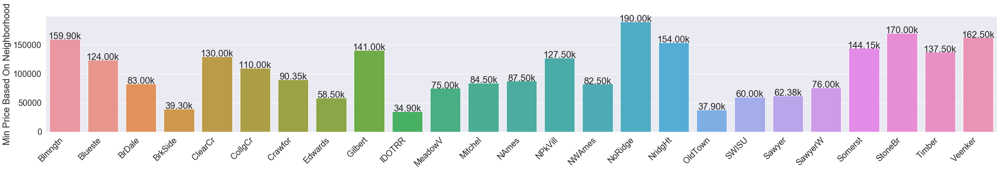

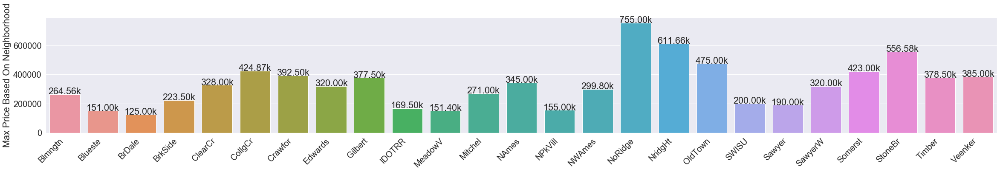

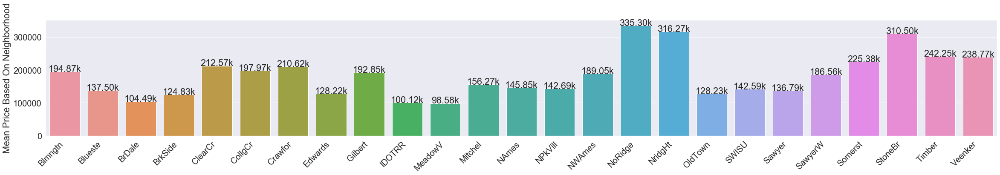

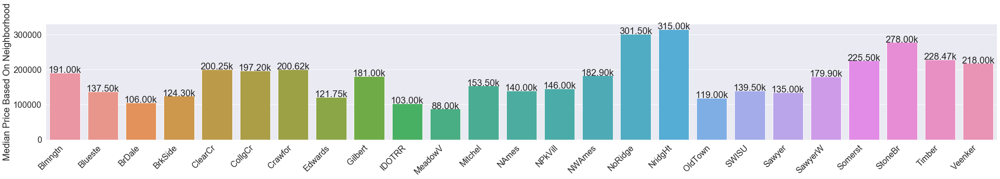

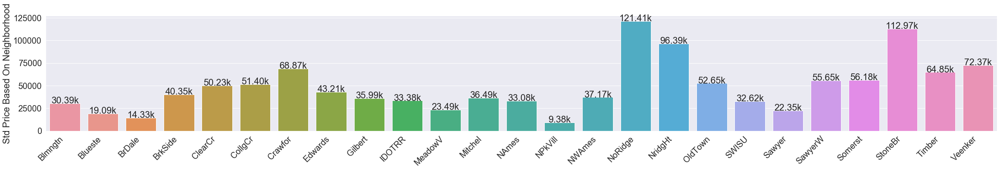

In [77]:
for stat in stat_list:
    sns.set(font_scale=1.8)
    fig = plt.figure(figsize=(40,5))
    ax = sns.barplot(n_stats.index.values.tolist(), n_stats[stat])
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment = 'right')
    ax.set_ylabel(stat + ' Price Based On Neighborhood')
    show_values_on_bars(ax)

Keeping this metric is a nobrainer in our regression analysis. Logically, in any city/town, there are desirable neighborhoods and less-desirable ones, and this will be a huge indicator of the price of a house. 

https://towardsdatascience.com/choosing-the-right-encoding-method-label-vs-onehot-encoder-a4434493149b

In [78]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split

In [79]:
LOWER_ALPHA = 0.1
UPPER_ALPHA = 0.9

In [80]:
lower_model = GradientBoostingRegressor(loss='quantile', alpha = LOWER_ALPHA)
mid_model = GradientBoostingRegressor(loss='ls')
upper_model = GradientBoostingRegressor(loss='quantile', alpha = UPPER_ALPHA)

In [81]:
onehot_df = pd.get_dummies(data[['Neighborhood', 'SalePrice']].copy(), columns = ['Neighborhood'], prefix = 'Neighborhood')

In [82]:
neighbor_list = [name for name in onehot_df.columns.values if name != 'SalePrice']

In [83]:
X_train, X_test, y_train, y_test = train_test_split(onehot_df[neighbor_list], onehot_df['SalePrice'], test_size = .2)

In [84]:
lower_model.fit(X_train, y_train)
mid_model.fit(X_train, y_train)
upper_model.fit(X_train, y_train)

predictions = pd.DataFrame(y_test)

predictions['lower'] = lower_model.predict(X_test)
predictions['mid'] = mid_model.predict(X_test)
predictions['upper'] = upper_model.predict(X_test)

In [85]:
predictions.reset_index(inplace = True)
predictions.head()

,Id,SalePrice,lower,mid,upper
0,1216,125000.0,111212.235917,141439.260263,162819.373326
1,330,78000.0,55584.938756,109578.120650,151617.152020
2,1404,282922.0,151971.825699,219489.156742,287877.600300
3,163,220000.0,175874.025995,322634.396333,426719.048413
4,147,105000.0,84956.734737,135752.309670,208261.454286


In [86]:
graph_df = predictions.melt('Id', var_name = 'metric', value_name = 'Price')

In [87]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot, plot, init_notebook_mode

Calculating Error of the prediction range

In [88]:
def calculate_error(predictions):
    """
    Calculate the absolute error associated with prediction intervals
    
    :param predictions: dataframe of predictions
    :return: None, modifies the prediction dataframe
    
    """
    predictions['absolute_error_lower'] = (predictions['lower'] - predictions['SalePrice']).abs()
    predictions['absolute_error_upper'] = (predictions['upper'] - predictions['SalePrice']).abs()
    
    predictions['absolute_error_interval'] = (predictions['absolute_error_lower'] + predictions['absolute_error_upper']) / 2
    predictions['absolute_error_mid'] = (predictions['mid'] - predictions['SalePrice']).abs()
    
    predictions['in_bounds'] = predictions['SalePrice'].between(left=predictions['lower'], right=predictions['upper'])

In [89]:
calculate_error(predictions)

In [90]:
metrics = predictions[['absolute_error_lower', 'absolute_error_upper', 'absolute_error_interval', 'absolute_error_mid', 'in_bounds']].copy()
metrics.describe()

,absolute_error_lower,absolute_error_upper,absolute_error_interval,absolute_error_mid
count,292.000000,292.000000,292.000000,292.000000
mean,59718.470165,71693.367076,65705.918621,41183.921649
std,65435.876933,54928.598899,44565.366572,47698.878928
min,199.349547,425.658318,18726.629241,166.640991
25%,20262.764083,35242.235358,38911.295064,11100.433596
50%,38094.207268,57745.706960,56719.345777,29373.087096
75%,77465.060078,95223.515139,68010.661234,51218.570205
max,532440.070978,403944.692730,468192.381854,446868.588778


In [91]:
def show_metrics(metrics):
    """
    Make a boxplot of the metrics associated with prediction intervals
    
    :param metrics: dataframe of metrics produced from calculate error 
    :return fig: plotly figure
    """
    percent_in_bounds = metrics['in_bounds'].mean() * 100
    metrics_to_plot = metrics[[c for c in metrics if 'absolute_error' in c]]

    # Rename the columns
    metrics_to_plot.columns = [column.split('_')[-1].title() for column in metrics_to_plot]

    # Create a boxplot of the metrics
    fig = px.box(
        metrics_to_plot.melt(var_name="metric", value_name='Absolute Error'),
        x="metric",
        y="Absolute Error",
        color='metric',
        title=f"Error Metrics Boxplots    In Bounds = {percent_in_bounds:.2f}%",
        height=800,
        width=1000,
        points=False,
    )

    # Create new data with no legends
    d = []

    for trace in fig.data:
        # Remove legend for each trace
        trace['showlegend'] = False
        d.append(trace)

    # Make the plot look a little better
    fig.data = d
    fig['layout']['font'] = dict(size=20)
    return fig


iplot(show_metrics(metrics))

https://towardsdatascience.com/how-to-generate-prediction-intervals-with-scikit-learn-and-python-ab3899f992ed
https://nbviewer.jupyter.org/github/WillKoehrsen/Data-Analysis/blob/master/prediction-intervals/prediction_intervals.ipynb

It's pretty impressive that the neighborhood metric can stay within the prediction interval bounds 80% of the time. 

Let's start looking at the continuous variables to see if we can find a good correlation, starting with Square Footage. The Highest variables in our correlation heatmap were GrLivArea, GarageArea, 1stFlrSF, TotalBsmtSF, 2ndFlrSF


In [92]:
def prediction_intervals(parameter, df):
    LOWER_ALPHA = 0.1
    UPPER_ALPHA = 0.9
    lower_model = GradientBoostingRegressor(loss='quantile', alpha = LOWER_ALPHA)
    mid_model = GradientBoostingRegressor(loss='ls')
    upper_model = GradientBoostingRegressor(loss='quantile', alpha = UPPER_ALPHA)
    X_train, X_test, y_train, y_test = train_test_split(df[parameter], df['SalePrice'], test_size = .2)
    lower_model.fit(X_train, y_train)
    mid_model.fit(X_train, y_train)
    upper_model.fit(X_train, y_train)

    predictions = pd.DataFrame(y_test)

    predictions['lower'] = lower_model.predict(X_test)
    predictions['mid'] = mid_model.predict(X_test)
    predictions['upper'] = upper_model.predict(X_test)
    predictions.reset_index(inplace = True)
    graph_df = predictions.melt('Id', var_name = 'metric', value_name = 'Price')
    def calculate_error(predictions):
        """
        Calculate the absolute error associated with prediction intervals

        :param predictions: dataframe of predictions
        :return: None, modifies the prediction dataframe

        """
        predictions['absolute_error_lower'] = (predictions['lower'] - predictions['SalePrice']).abs()
        predictions['absolute_error_upper'] = (predictions['upper'] - predictions['SalePrice']).abs()

        predictions['absolute_error_interval'] = (predictions['absolute_error_lower'] + predictions['absolute_error_upper']) / 2
        predictions['absolute_error_mid'] = (predictions['mid'] - predictions['SalePrice']).abs()

        predictions['in_bounds'] = predictions['SalePrice'].between(left=predictions['lower'], right=predictions['upper'])
    calculate_error(predictions)
    metrics = predictions[['absolute_error_lower', 'absolute_error_upper', 'absolute_error_interval', 'absolute_error_mid', 'in_bounds']].copy()
    metrics.describe()
    iplot(show_metrics(metrics))


In [93]:
general_df = data[['MSSubClass', 'GrLivArea', 'GarageArea', 'TotalBsmtSF', 'SalePrice']].copy()

In [94]:
one_hot_general = pd.get_dummies(general_df.copy(), columns = ['MSSubClass'], prefix = 'Class')

In [95]:
parameters_list = [col for col in one_hot_general.columns.values if col != 'SalePrice']

In [96]:
prediction_intervals(parameters_list + neighbor_list, pd.concat([one_hot_general, onehot_df[neighbor_list]], axis = 1))

In [97]:
subset = pd.concat([one_hot_general, onehot_df[neighbor_list]], axis = 1)
to_log = ['SalePrice']
log_list = []
for item in to_log:
    subset['log_' + item] = np.log(subset[item])
    log_list.append('log_' + item)
subset.drop(to_log, axis = 1, inplace = True)
X = subset[parameters_list + neighbor_list]
Y = subset['log_SalePrice']

In [98]:
from sklearn.neighbors import KNeighborsClassifier

In [107]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import lars_path
from sklearn.linear_model import LinearRegression, Lasso, LassoCV
from sklearn.metrics import r2_score
import scipy.stats as stats

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)

In [101]:
model_sm = sm.OLS(y_train, X_train)
fit_price = model_sm.fit()
fit_price.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     122.2
Date:                Fri, 14 Feb 2020   Prob (F-statistic):               0.00
Time:                        19:29:26   Log-Likelihood:                 401.95
No. Observations:                1168   AIC:                            -719.9
Df Residuals:                    1126   BIC:                            -507.3
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
GrLivArea                0.0003   1.82e-05     14.963      0.000       0.000       0.000
GarageArea               0.0003   3.33e-05      9.198      0.000       0.000       0.000
TotalBsmtSF              0.0001   1.86e-05      7.133      0.000    9.61e-05       0.000
Class_20                 7.1366      0.020    359.305      0.000       7.098       7.176
Class_30                 6.9241      0.030    232.256      0.000       6.866       6.983
Class_40                 7.1075      0.101     70.364      0.000       6.909       7.306
Class_45                 6.9897      0.064    109.451      0.000       6.864       7.115
Class_50                 7.0700      0.026    273.444      0.000       7.019       7.121
Class_60                 7.1579      0.027    269.440      0.000       7.106       7.210
Class_70                 7.1027      0.036    197.869      0.000       7.032       7.173
Class_75                 7.1001      0.057    123.828      0.000       6.988       7.213
Class_80                 7.1794      0.031    229.015      0.000       7.118       7.241
Class_85                 7.1550      0.047    151.092      0.000       7.062       7.248
Class_90                 6.9606      0.033    210.311      0.000       6.896       7.026
Class_120                7.1028      0.027    263.016      0.000       7.050       7.156
Class_160                6.9782      0.035    198.603      0.000       6.909       7.047
Class_180                7.1497      0.077     93.114      0.000       6.999       7.300
Class_190                6.9689      0.041    172.024      0.000       6.889       7.048
Neighborhood_Blmngtn     4.3159      0.054     79.992      0.000       4.210       4.422
Neighborhood_Blueste     4.2436      0.125     33.913      0.000       3.998       4.489
Neighborhood_BrDale      4.0941      0.056     72.732      0.000       3.984       4.205
Neighborhood_BrkSide     4.1175      0.030    135.919      0.000       4.058       4.177
Neighborhood_ClearCr     4.3329      0.038    115.377      0.000       4.259       4.407
Neighborhood_CollgCr     4.2914      0.020    212.811      0.000       4.252       4.331
Neighborhood_Crawfor     4.4013      0.032    135.896      0.000       4.338       4.465
Neighborhood_Edwards     4.0459      0.021    189.622      0.000       4.004       4.088
Neighborhood_Gilbert     4.2948      0.026    163.476      0.000       4.243       4.346
Neighborhood_IDOTRR      3.9441      0.036    110.121      0.000       3.874       4.014
Neighborhood_MeadowV     3.9381      0.059     67.030      0.000       3.823       4.053
Neighborhood_Mitchel     4.1870      0.030    141.537      0.000       4.129       4.245
Neighborhood_NAmes       4.1235      0.017    239.269      0.000       4.090       4.157
Neighborhood_NPkVill     4.2253      0.080     52.994    

Uh oh, we have some multicollinearity problems! This is probably because we made some errors in our data processing. Let's see if we can fix that by taking it out or changing these around. 

In [102]:
def print_corrmap(df):
    df_corr = df.corr()
    df_corr = pd.melt(df_corr.reset_index(), id_vars = 'index')
    df_corr.columns = ['x', 'y', 'value']
    heatmap(
            x = df_corr['x'],
            y = df_corr['y'],
            size = df_corr['value'].abs(),
            color = df_corr['value']
            )

In [103]:
print_corrmap(subset)

In [104]:
subset['HasBasement'] = subset['TotalBsmtSF']
subset['HasBasement'].apply(lambda x: 1 if (x > 0) else 0)
subset.drop('TotalBsmtSF', axis = 1, inplace = True)

In [105]:
parameters_list.remove('TotalBsmtSF')

In [106]:
X = subset[parameters_list + neighbor_list + ['HasBasement']]
Y = subset['log_SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)
model_sm = sm.OLS(y_train, X_train)
fit_price = model_sm.fit()
fit_price.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     118.9
Date:                Fri, 14 Feb 2020   Prob (F-statistic):               0.00
Time:                        19:29:40   Log-Likelihood:                 393.56
No. Observations:                1168   AIC:                            -703.1
Df Residuals:                    1126   BIC:                            -490.5
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
GrLivArea                0.0003   1.88e-05     15.061      0.000       0.000       0.000
GarageArea               0.0003   3.28e-05      8.508      0.000       0.000       0.000
Class_20                 7.1299      0.020    358.140      0.000       7.091       7.169
Class_30                 6.9360      0.030    232.588      0.000       6.878       6.995
Class_40                 7.0713      0.101     69.875      0.000       6.873       7.270
Class_45                 7.0691      0.055    128.110      0.000       6.961       7.177
Class_50                 7.0419      0.026    270.857      0.000       6.991       7.093
Class_60                 7.1423      0.027    268.257      0.000       7.090       7.195
Class_70                 7.1054      0.036    195.797      0.000       7.034       7.177
Class_75                 7.0536      0.058    121.874      0.000       6.940       7.167
Class_80                 7.1819      0.032    222.681      0.000       7.119       7.245
Class_85                 7.1936      0.048    149.951      0.000       7.099       7.288
Class_90                 6.9441      0.033    207.355      0.000       6.878       7.010
Class_120                7.1057      0.028    258.131      0.000       7.052       7.160
Class_160                6.9663      0.036    194.095      0.000       6.896       7.037
Class_180                7.1369      0.068    104.399      0.000       7.003       7.271
Class_190                7.0051      0.041    169.981      0.000       6.924       7.086
Neighborhood_Blmngtn     4.3087      0.058     74.329      0.000       4.195       4.422
Neighborhood_Blueste     4.2550      0.126     33.727      0.000       4.007       4.503
Neighborhood_BrDale      4.0924      0.060     68.285      0.000       3.975       4.210
Neighborhood_BrkSide     4.1181      0.030    138.155      0.000       4.060       4.177
Neighborhood_ClearCr     4.3226      0.036    121.058      0.000       4.253       4.393
Neighborhood_CollgCr     4.3067      0.020    210.650      0.000       4.267       4.347
Neighborhood_Crawfor     4.4052      0.032    135.648      0.000       4.341       4.469
Neighborhood_Edwards     4.0588      0.022    185.516      0.000       4.016       4.102
Neighborhood_Gilbert     4.3118      0.025    169.832      0.000       4.262       4.362
Neighborhood_IDOTRR      3.9322      0.037    107.630      0.000       3.860       4.004
Neighborhood_MeadowV     3.9689      0.056     71.391      0.000       3.860       4.078
Neighborhood_Mitchel     4.1848      0.029    142.657      0.000       4.127       4.242
Neighborhood_NAmes       4.1303      0.017    240.611      0.000       4.097       4.164
Neighborhood_NPkVill     4.2371      0.066     64.661      0.000       4.109       4.366
Neighborhood_NWAmes      4.2037      0.027    153.013    

In [115]:
fit = ols('SalePrice ~ C(Neighborhood) + C(MSSubClass) + GrLivArea', data=data).fit() 

In [116]:
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     138.0
Date:                Fri, 14 Feb 2020   Prob (F-statistic):               0.00
Time:                        19:43:07   Log-Likelihood:                 412.11
No. Observations:                1460   AIC:                            -744.2
Df Residuals:                    1420   BIC:                            -532.8
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     11.6127      0.056    208.723      0.000      11.504      11.722
C(Neighborhood)[T.Blueste]    -0.0881      0.143     -0.614      0.539      -0.370       0.193
C(Neighborhood)[T.BrDale]     -0.2610      0.075     -3.472      0.001      -0.408      -0.114
C(Neighborhood)[T.BrkSide]    -0.2738      0.059     -4.616      0.000      -0.390      -0.157
C(Neighborhood)[T.ClearCr]    -0.0595      0.061     -0.973      0.331      -0.179       0.060
C(Neighborhood)[T.CollgCr]    -0.0401      0.052     -0.767      0.443      -0.143       0.063
C(Neighborhood)[T.Crawfor]    -0.0364      0.058     -0.626      0.532      -0.150       0.078
C(Neighborhood)[T.Edwards]    -0.3593      0.055     -6.580      0.000      -0.466      -0.252
C(Neighborhood)[T.Gilbert]    -0.0737      0.056     -1.326      0.185      -0.183       0.035
C(Neighborhood)[T.IDOTRR]     -0.4737      0.062     -7.629      0.000      -0.596      -0.352
C(Neighborhood)[T.MeadowV]    -0.4279      0.075     -5.703      0.000      -0.575      -0.281
C(Neighborhood)[T.Mitchel]    -0.1668      0.057     -2.931      0.003      -0.278      -0.055
C(Neighborhood)[T.NAmes]      -0.2600      0.052     -4.956      0.000      -0.363      -0.157
C(Neighborhood)[T.NPkVill]    -0.0941      0.079     -1.189      0.235      -0.249       0.061
C(Neighborhood)[T.NWAmes]     -0.1662      0.055     -3.015      0.003      -0.274      -0.058
C(Neighborhood)[T.NoRidge]     0.0853      0.059      1.448      0.148      -0.030       0.201
C(Neighborhood)[T.NridgHt]     0.2471      0.052      4.708      0.000       0.144       0.350
C(Neighborhood)[T.OldTown]    -0.3667      0.056     -6.515      0.000      -0.477      -0.256
C(Neighborhood)[T.SWISU]      -0.3602      0.066     -5.493      0.000      -0.489      -0.232
C(Neighborhood)[T.Sawyer]     -0.2772      0.056     -4.986      0.000      -0.386      -0.168
C(Neighborhood)[T.SawyerW]    -0.1263      0.055     -2.288      0.022      -0.235      -0.018
C(Neighborhood)[T.Somerst]     0.1139      0.054      2.108      0.035       0.008       0.220
C(Neighborhood)[T.StoneBr]     0.2411      0.060      4.051      0.000       0.124       0.358
C(Neighborhood)[T.Timber]      0.0425      0.059      0.722      0.470      -0.073       0.158
C(Neighborhood)[T.Veenker]     0.1025      0.074      1.391      0.164      -0.042       0.247
C(MSSubClass)[T.30]           -0.2255      0.029     -7.661      0.000      -0.283      -0.168
C(MSSubClass)[T.40]           -0.0690      0.094     -0.734      0.463      -0.253       0.115
C(MSSubClass)[T.45]           -0.1174      0.056     -2.081      0.038      -0.228      -0.007
C(MSSubClass)[T.50]           -0.1632      0.022     -7.312      0.000      -0.207      -0.119
C(MSSubClass)[T.60]           -0.0976      

In [111]:
log_data = data.copy()

to_log = ['SalePrice']
log_list = []
for item in to_log:
    log_data['log_' + item] = np.log(log_data[item])
    log_list.append('log_' + item)
log_data.drop(to_log, axis = 1, inplace = True)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2)

In [117]:
fit = ols('log_SalePrice ~ C(Neighborhood) + C(MSSubClass) + GrLivArea', data=log_data).fit() 

In [118]:
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     138.0
Date:                Fri, 14 Feb 2020   Prob (F-statistic):               0.00
Time:                        19:44:55   Log-Likelihood:                 412.11
No. Observations:                1460   AIC:                            -744.2
Df Residuals:                    1420   BIC:                            -532.8
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     11.6127      0.056    208.723      0.000      11.504      11.722
C(Neighborhood)[T.Blueste]    -0.0881      0.143     -0.614      0.539      -0.370       0.193
C(Neighborhood)[T.BrDale]     -0.2610      0.075     -3.472      0.001      -0.408      -0.114
C(Neighborhood)[T.BrkSide]    -0.2738      0.059     -4.616      0.000      -0.390      -0.157
C(Neighborhood)[T.ClearCr]    -0.0595      0.061     -0.973      0.331      -0.179       0.060
C(Neighborhood)[T.CollgCr]    -0.0401      0.052     -0.767      0.443      -0.143       0.063
C(Neighborhood)[T.Crawfor]    -0.0364      0.058     -0.626      0.532      -0.150       0.078
C(Neighborhood)[T.Edwards]    -0.3593      0.055     -6.580      0.000      -0.466      -0.252
C(Neighborhood)[T.Gilbert]    -0.0737      0.056     -1.326      0.185      -0.183       0.035
C(Neighborhood)[T.IDOTRR]     -0.4737      0.062     -7.629      0.000      -0.596      -0.352
C(Neighborhood)[T.MeadowV]    -0.4279      0.075     -5.703      0.000      -0.575      -0.281
C(Neighborhood)[T.Mitchel]    -0.1668      0.057     -2.931      0.003      -0.278      -0.055
C(Neighborhood)[T.NAmes]      -0.2600      0.052     -4.956      0.000      -0.363      -0.157
C(Neighborhood)[T.NPkVill]    -0.0941      0.079     -1.189      0.235      -0.249       0.061
C(Neighborhood)[T.NWAmes]     -0.1662      0.055     -3.015      0.003      -0.274      -0.058
C(Neighborhood)[T.NoRidge]     0.0853      0.059      1.448      0.148      -0.030       0.201
C(Neighborhood)[T.NridgHt]     0.2471      0.052      4.708      0.000       0.144       0.350
C(Neighborhood)[T.OldTown]    -0.3667      0.056     -6.515      0.000      -0.477      -0.256
C(Neighborhood)[T.SWISU]      -0.3602      0.066     -5.493      0.000      -0.489      -0.232
C(Neighborhood)[T.Sawyer]     -0.2772      0.056     -4.986      0.000      -0.386      -0.168
C(Neighborhood)[T.SawyerW]    -0.1263      0.055     -2.288      0.022      -0.235      -0.018
C(Neighborhood)[T.Somerst]     0.1139      0.054      2.108      0.035       0.008       0.220
C(Neighborhood)[T.StoneBr]     0.2411      0.060      4.051      0.000       0.124       0.358
C(Neighborhood)[T.Timber]      0.0425      0.059      0.722      0.470      -0.073       0.158
C(Neighborhood)[T.Veenker]     0.1025      0.074      1.391      0.164      -0.042       0.247
C(MSSubClass)[T.30]           -0.2255      0.029     -7.661      0.000      -0.283      -0.168
C(MSSubClass)[T.40]           -0.0690      0.094     -0.734      0.463      -0.253       0.115
C(MSSubClass)[T.45]           -0.1174      0.056     -2.081      0.038      -0.228      -0.007
C(MSSubClass)[T.50]           -0.1632      0.022     -7.312      0.000      -0.207      -0.119
C(MSSubClass)[T.60]           -0.0976      

In [123]:
sq_fit = ols('log_SalePrice ~ C(Neighborhood) + C(MSSubClass) + C(YearRemodAdd)', data=log_data).fit() 

In [124]:
sq_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.701
Model:                            OLS   Adj. R-squared:                  0.680
Method:                 Least Squares   F-statistic:                     32.56
Date:                Fri, 14 Feb 2020   Prob (F-statistic):          2.44e-289
Time:                        19:55:45   Log-Likelihood:                 150.05
No. Observations:                1460   AIC:                            -102.1
Df Residuals:                    1361   BIC:                             421.2
Df Model:                          98                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     12.0471      0.069    175.217      0.000      11.912      12.182
C(Neighborhood)[T.Blueste]    -0.1780      0.190     -0.935      0.350      -0.551       0.195
C(Neighborhood)[T.BrDale]     -0.3200      0.098     -3.256      0.001      -0.513      -0.127
C(Neighborhood)[T.BrkSide]    -0.3988      0.074     -5.356      0.000      -0.545      -0.253
C(Neighborhood)[T.ClearCr]    -0.0243      0.078     -0.312      0.755      -0.177       0.129
C(Neighborhood)[T.CollgCr]    -0.1773      0.066     -2.706      0.007      -0.306      -0.049
C(Neighborhood)[T.Crawfor]     0.0063      0.073      0.087      0.931      -0.137       0.149
C(Neighborhood)[T.Edwards]    -0.4358      0.069     -6.337      0.000      -0.571      -0.301
C(Neighborhood)[T.Gilbert]    -0.2451      0.070     -3.526      0.000      -0.382      -0.109
C(Neighborhood)[T.IDOTRR]     -0.6021      0.078     -7.756      0.000      -0.754      -0.450
C(Neighborhood)[T.MeadowV]    -0.5008      0.097     -5.141      0.000      -0.692      -0.310
C(Neighborhood)[T.Mitchel]    -0.2802      0.072     -3.885      0.000      -0.422      -0.139
C(Neighborhood)[T.NAmes]      -0.3266      0.067     -4.890      0.000      -0.458      -0.196
C(Neighborhood)[T.NPkVill]    -0.1114      0.103     -1.081      0.280      -0.314       0.091
C(Neighborhood)[T.NWAmes]     -0.1556      0.071     -2.183      0.029      -0.295      -0.016
C(Neighborhood)[T.NoRidge]     0.2737      0.076      3.623      0.000       0.126       0.422
C(Neighborhood)[T.NridgHt]     0.2827      0.065      4.343      0.000       0.155       0.410
C(Neighborhood)[T.OldTown]    -0.4637      0.071     -6.540      0.000      -0.603      -0.325
C(Neighborhood)[T.SWISU]      -0.3515      0.082     -4.264      0.000      -0.513      -0.190
C(Neighborhood)[T.Sawyer]     -0.4068      0.071     -5.745      0.000      -0.546      -0.268
C(Neighborhood)[T.SawyerW]    -0.1773      0.071     -2.497      0.013      -0.317      -0.038
C(Neighborhood)[T.Somerst]    -0.0161      0.067     -0.240      0.810      -0.147       0.115
C(Neighborhood)[T.StoneBr]     0.3460      0.075      4.635      0.000       0.200       0.492
C(Neighborhood)[T.Timber]      0.0207      0.074      0.281      0.779      -0.124       0.165
C(Neighborhood)[T.Veenker]     0.1154      0.093      1.236      0.217      -0.068       0.299
C(MSSubClass)[T.30]           -0.2866      0.038     -7.640      0.000      -0.360      -0.213
C(MSSubClass)[T.40]            0.0150      0.118      0.127      0.899      -0.217       0.247
C(MSSubClass)[T.45]           -0.1617      0.070     -2.306      0.021      -0.299      -0.024
C(MSSubClass)[T.50]            0.0292      0.029      0.997      0.319      -0.028       0.087
C(MSSubClass)[T.60]            0.1279      

Not surprisingly, there's a strong correlation between how big the house is with what neighborhood it's in and the type of house that it is. This causes us to have high multicollinearity in our regression.